# Load Data

In [4]:
import torch
import pandas as pd
import scanpy as sc
import numpy as np
import scipy.stats
from pathlib import Path
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests

## Load embeddings and aligned data

In [5]:
embeddings = torch.load("SHINE embeddings.pt")
emb_combined = embeddings['emb_combined']
emb_recon_transcript = embeddings['emb_recon_transcript']
emb_recon_metabolite = embeddings['emb_recon_metabolite']
emb_latent_transcript = embeddings['emb_latent_transcript']
emb_latent_metabolite = embeddings['emb_latent_metabolite']

In [6]:
transcript_info = pd.read_csv("aligned_ST_data.csv")
transcript_expr = transcript_info.iloc[:, 3:]
print(transcript_expr)
genes = transcript_expr.columns
genes

           Vxn     Cops5     Prex2     Terf1   Fam135a  Khdrbs2  Prim2  \
0     0.000000  0.000000  0.000000  2.303486  0.000000      0.0    0.0   
1     1.440226  0.000000  0.000000  1.440226  1.440226      0.0    0.0   
2     1.904967  0.000000  0.000000  0.000000  0.000000      0.0    0.0   
3     0.000000  0.000000  0.000000  0.000000  0.000000      0.0    0.0   
4     0.971550  0.000000  0.000000  0.000000  0.000000      0.0    0.0   
...        ...       ...       ...       ...       ...      ...    ...   
3350  0.000000  0.000000  1.764376  0.000000  0.000000      0.0    0.0   
3351  0.000000  1.418251  0.000000  0.000000  0.000000      0.0    0.0   
3352  0.000000  1.191655  1.191655  0.000000  0.000000      0.0    0.0   
3353  0.000000  0.888481  0.000000  0.000000  0.000000      0.0    0.0   
3354  0.000000  0.000000  0.000000  0.000000  0.000000      0.0    0.0   

         Rab23  Ccdc115  1110002O04Rik  ...  Piga    Mospd2  Egfl6  Msl3  \
0     0.000000      0.0            

Index(['Vxn', 'Cops5', 'Prex2', 'Terf1', 'Fam135a', 'Khdrbs2', 'Prim2',
       'Rab23', 'Ccdc115', '1110002O04Rik',
       ...
       'Piga', 'Mospd2', 'Egfl6', 'Msl3', 'Hccs', 'Kdm5d', 'Gm29650',
       'Gm21860', 'Gm47283', 'mt-Nd3'],
      dtype='object', length=2000)

In [7]:
metabolite_info = pd.read_csv("aligned_SM_data.csv")
metabolite_abundance = metabolite_info.iloc[:, 3:]
print(metabolite_abundance)
metabolites = metabolite_abundance.columns
metabolites

      156.26059  156.26195  156.48344  156.4838  156.485  157.54681  \
0      0.000000   0.000000   0.000000  0.000000      0.0   0.000000   
1      0.000000   0.000000   0.000000  0.000000      0.0   0.000000   
2      0.381777   0.000000   0.000000  0.000000      0.0   0.000000   
3      0.975414   0.071164   0.531492  0.556057      0.0   0.000000   
4      0.226253   0.000000   0.000000  0.000000      0.0   0.000000   
...         ...        ...        ...       ...      ...        ...   
3350   0.272135   0.000000   0.000000  0.000000      0.0   0.150094   
3351   0.225256   0.074012   0.000000  0.000000      0.0   0.000000   
3352   0.136503   0.000000   0.096833  0.269110      0.0   0.000000   
3353   0.500305   0.077110   0.153716  0.000000      0.0   0.068854   
3354   0.565256   0.000000   0.212151  0.256917      0.0   0.000000   

      158.41217  160.02547  170.45622  170.45738  ...  1044.29885  1044.3523  \
0      0.678486   0.000000   1.164677   0.000000  ...    0.000000  

Index(['156.26059', '156.26195', '156.48344', '156.4838', '156.485',
       '157.54681', '158.41217', '160.02547', '170.45622', '170.45738',
       ...
       '1044.29885', '1044.3523', '1046.31366', '1046.32671', '1046.33977',
       '1046.36442', '1048.32025', '1048.3319', '1048.34354', '1048.38431'],
      dtype='object', length=1538)

In [8]:
# Load original Visium AnnData
visium_path = Path("V11T16-085_B1/output_data/V11T16-085_B1_RNA/outs")
adata = sc.read_visium(path=visium_path)
adata.var_names_make_unique()

# Load matched transcript and metabolite info
transcript_info = pd.read_csv("aligned_ST_data.csv", index_col='spot')

barcodes_filtered = transcript_info.index.intersection(adata.obs_names)
adata_filtered = adata[barcodes_filtered, :].copy()

transcript_info = transcript_info.loc[barcodes_filtered, :]
adata_filtered = adata_filtered[transcript_info.index, :]

adata_filtered.obsm['spatial'] = adata_filtered.obsm['spatial']
adata_filtered

/Users/dubingxue/opt/anaconda3/envs/transcript/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3355 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
assert emb_combined.shape[0] == adata_filtered.n_obs, "Mismatch in combined embedding rows!"

for factor_idx in range(emb_combined.shape[1]):
    adata_filtered.obs[f'latent_combined_{factor_idx+1}'] = emb_combined[:, factor_idx]

print(adata_filtered.obs.iloc[:, -10:].head())
adata_filtered

                    latent_combined_247  latent_combined_248  \
AAACAACGAATAGTTC-1             0.113321                  0.0   
AAACAAGTATCTCCCA-1             0.113027                  0.0   
AAACAATCTACTAGCA-1             0.113151                  0.0   
AAACAGCTTTCAGAAG-1             0.112595                  0.0   
AAACATTTCCCGGATT-1             0.113329                  0.0   

                    latent_combined_249  latent_combined_250  \
AAACAACGAATAGTTC-1             0.095764             0.021964   
AAACAAGTATCTCCCA-1             0.095607             0.021776   
AAACAATCTACTAGCA-1             0.095669             0.021651   
AAACAGCTTTCAGAAG-1             0.095506             0.022109   
AAACATTTCCCGGATT-1             0.095648             0.021751   

                    latent_combined_251  latent_combined_252  \
AAACAACGAATAGTTC-1             0.015077                  0.0   
AAACAAGTATCTCCCA-1             0.015190                  0.0   
AAACAATCTACTAGCA-1             0.01493

AnnData object with n_obs × n_vars = 3355 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'latent_combined_1', 'latent_combined_2', 'latent_combined_3', 'latent_combined_4', 'latent_combined_5', 'latent_combined_6', 'latent_combined_7', 'latent_combined_8', 'latent_combined_9', 'latent_combined_10', 'latent_combined_11', 'latent_combined_12', 'latent_combined_13', 'latent_combined_14', 'latent_combined_15', 'latent_combined_16', 'latent_combined_17', 'latent_combined_18', 'latent_combined_19', 'latent_combined_20', 'latent_combined_21', 'latent_combined_22', 'latent_combined_23', 'latent_combined_24', 'latent_combined_25', 'latent_combined_26', 'latent_combined_27', 'latent_combined_28', 'latent_combined_29', 'latent_combined_30', 'latent_combined_31', 'latent_combined_32', 'latent_combined_33', 'latent_combined_34', 'latent_combined_35', 'latent_combined_36', 'latent_combined_37', 'latent_combined_38', 'latent_combined_39', 'latent_combined_40', 'latent_combined_41', 'latent_c

In [10]:
for factor_idx in range(emb_combined.shape[1]):
    adata_filtered.obs[f'latent_combined_{factor_idx}'] = emb_combined[:, factor_idx]

adata_filtered.obs.head()


,in_tissue,array_row,array_col,latent_combined_1,latent_combined_2,latent_combined_3,latent_combined_4,latent_combined_5,latent_combined_6,latent_combined_7,...,latent_combined_248,latent_combined_249,latent_combined_250,latent_combined_251,latent_combined_252,latent_combined_253,latent_combined_254,latent_combined_255,latent_combined_256,latent_combined_0
AAACAACGAATAGTTC-1,1,0,16,0.114386,0.095717,0.0,0.065805,0.009493,0.0,0.000993,...,0.095764,0.021964,0.015077,0.0,0.116839,0.0,0.018327,0.0,0.0,0.0
AAACAAGTATCTCCCA-1,1,50,102,0.114027,0.095468,0.0,0.065668,0.009108,0.0,0.000969,...,0.095607,0.021776,0.015190,0.0,0.116634,0.0,0.018294,0.0,0.0,0.0
AAACAATCTACTAGCA-1,1,3,43,0.114498,0.095714,0.0,0.065721,0.009596,0.0,0.000887,...,0.095669,0.021651,0.014936,0.0,0.116742,0.0,0.018319,0.0,0.0,0.0
AAACAGCTTTCAGAAG-1,1,43,9,0.114586,0.095145,0.0,0.066244,0.009338,0.0,0.001280,...,0.095506,0.022109,0.015303,0.0,0.116014,0.0,0.018199,0.0,0.0,0.0
AAACATTTCCCGGATT-1,1,61,97,0.114768,0.095947,0.0,0.065518,0.009727,0.0,0.001051,...,0.095648,0.021751,0.014991,0.0,0.116557,0.0,0.018370,0.0,0.0,0.0


## Annotation

In [11]:
# Load RegionLoupe labels
loupe_df = pd.read_csv(f"{visium_path}/RegionLoupe.csv")

# Rename Barcode column for consistency
loupe_df.rename(columns={'Barcode': 'barcode'}, inplace=True)

# Set barcode as index
loupe_df.set_index('barcode', inplace=True)

# Filter loupe_df to match adata_filtered.obs barcodes exactly
loupe_df_filtered = loupe_df.loc[adata_filtered.obs_names, :]

# Merge RegionLoupe labels into adata_filtered.obs
adata_filtered.obs = adata_filtered.obs.join(loupe_df_filtered, how='left')

# Check integration result
print(adata_filtered.obs.head())

                    in_tissue  array_row  array_col  latent_combined_1  \
AAACAACGAATAGTTC-1          1          0         16           0.114386   
AAACAAGTATCTCCCA-1          1         50        102           0.114027   
AAACAATCTACTAGCA-1          1          3         43           0.114498   
AAACAGCTTTCAGAAG-1          1         43          9           0.114586   
AAACATTTCCCGGATT-1          1         61         97           0.114768   

                    latent_combined_2  latent_combined_3  latent_combined_4  \
AAACAACGAATAGTTC-1           0.095717                0.0           0.065805   
AAACAAGTATCTCCCA-1           0.095468                0.0           0.065668   
AAACAATCTACTAGCA-1           0.095714                0.0           0.065721   
AAACAGCTTTCAGAAG-1           0.095145                0.0           0.066244   
AAACATTTCCCGGATT-1           0.095947                0.0           0.065518   

                    latent_combined_5  latent_combined_6  latent_combined_7  \
A

In [12]:
import pandas as pd

# Load Zeisel cell type prediction results
celltype_df = pd.read_csv("Zeisel_stsc_output.csv")

# Inspect the data structure
print(celltype_df.head())

# Keep only entries with barcodes ending in "_10"
celltype_df = celltype_df[celltype_df["Unnamed: 0"].str.endswith("_10")].copy()

# Remove the suffix "_10" to match barcodes in adata
celltype_df["barcode"] = celltype_df["Unnamed: 0"].str.replace("_10$", "", regex=True)

# Set barcode as the index
celltype_df.set_index("barcode", inplace=True)

# Assign the cell type with the highest predicted probability for each barcode
celltype_df["Cell type"] = celltype_df.iloc[:, 1:].idxmax(axis=1)

# Keep only the final cell type annotation
celltype_df = celltype_df[["Cell type"]]

celltype_df


             Unnamed: 0  Astrocytes  Cerebellum.neurons  \
0  TGGACCACGGCGTTGA-1_1    0.102054        1.795040e-11   
1  GCGGTAACCCAAATGA-1_1    0.115910        1.512089e-12   
2  CTAGATAAACTCCTCG-1_1    0.046326        1.394800e-02   
3  CTGGCTCCTGCGGGAT-1_1    0.077347        6.072674e-13   
4  GTATGACGTGGGAAAC-1_1    0.160772        7.925794e-02   

   Cholinergic.and.monoaminergic.neurons  \
0                           1.536204e-12   
1                           1.488970e-12   
2                           4.341540e-12   
3                           5.510188e-02   
4                           1.054869e-12   

   Cholinergic.and.monoaminergic.neurons.MBDOP1  \
0                                  8.743466e-13   
1                                  6.018266e-13   
2                                  7.575323e-13   
3                                  9.079394e-13   
4                                  5.987073e-13   

   Cholinergic.and.monoaminergic.neurons.MBDOP2  Choroid.epithelial.cells

,Cell type
barcode,
ACGCCTGACACGCGCT-1,Telencephalon.projecting.excitatory.neurons
TACCGATCCAACACTT-1,Telencephalon.projecting.excitatory.neurons
ATTAAAGCGGACGAGC-1,Telencephalon.projecting.excitatory.neurons
GATAAGGGACGATTAG-1,Oligodendrocytes
GTGCAAATCACCAATA-1,Telencephalon.projecting.excitatory.neurons
...,...
GAACGTTTGTATCCAC-1,Telencephalon.projecting.excitatory.neurons
ATTGAATTCCCTGTAG-1,Telencephalon.projecting.excitatory.neurons
TACCTCACCAATTGTA-1,Telencephalon.projecting.excitatory.neurons


In [13]:
# Filter celltype_df to match adata_filtered.obs barcodes exactly
celltype_df_filtered = celltype_df.loc[adata_filtered.obs_names, :]

# Merge RegionLoupe labels into adata_filtered.obs
adata_filtered.obs = adata_filtered.obs.join(celltype_df_filtered, how='left')

# Check integration result
adata_filtered

AnnData object with n_obs × n_vars = 3355 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'latent_combined_1', 'latent_combined_2', 'latent_combined_3', 'latent_combined_4', 'latent_combined_5', 'latent_combined_6', 'latent_combined_7', 'latent_combined_8', 'latent_combined_9', 'latent_combined_10', 'latent_combined_11', 'latent_combined_12', 'latent_combined_13', 'latent_combined_14', 'latent_combined_15', 'latent_combined_16', 'latent_combined_17', 'latent_combined_18', 'latent_combined_19', 'latent_combined_20', 'latent_combined_21', 'latent_combined_22', 'latent_combined_23', 'latent_combined_24', 'latent_combined_25', 'latent_combined_26', 'latent_combined_27', 'latent_combined_28', 'latent_combined_29', 'latent_combined_30', 'latent_combined_31', 'latent_combined_32', 'latent_combined_33', 'latent_combined_34', 'latent_combined_35', 'latent_combined_36', 'latent_combined_37', 'latent_combined_38', 'latent_combined_39', 'latent_combined_40', 'latent_combined_41', 'latent_c

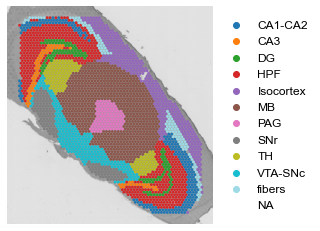

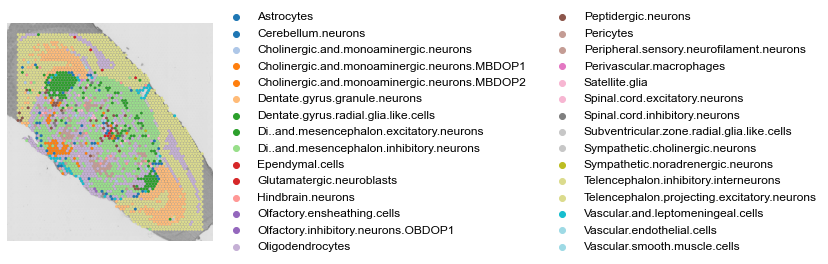

In [14]:
import scanpy as sc
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['axes.titlesize'] = 14  
plt.rcParams['legend.fontsize'] = 12  

# RegionLoupe figure
axs = sc.pl.spatial(
    adata_filtered,
    img_key="hires",
    color="RegionLoupe",
    size=1.5,
    palette='tab20',
    alpha_img=0.6,
    bw=True,
    show=False,
    title=""
)

for ax in axs:
    ax.axis('off')

# plt.savefig('RegionLoupe.svg', format='svg', bbox_inches='tight')
plt.show()

# Cell type figure
axs = sc.pl.spatial(
    adata_filtered,
    img_key="hires",
    color="Cell type",
    size=1.5,
    palette='tab20',
    alpha_img=0.6,
    bw=True,
    show=False,
    title=""
)

for ax in axs:
    ax.axis('off')

plt.savefig('CellType.svg', format='svg', bbox_inches='tight')
plt.show()


# Clustering

## ST latent embedding

/Users/dubingxue/opt/anaconda3/envs/transcript/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


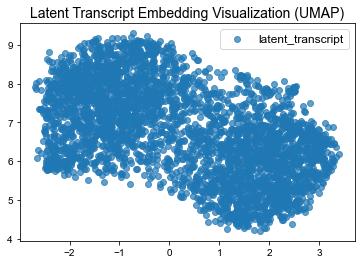

In [15]:
# Initialize the UMAP reducer
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Perform UMAP dimensionality reduction
reduced_latent_transcript_umap = umap_reducer.fit_transform(emb_latent_transcript)

# Plot the UMAP embedding
plt.scatter(
    reduced_latent_transcript_umap[:, 0],
    reduced_latent_transcript_umap[:, 1],
    label="latent_transcript",
    alpha=0.7
)
plt.legend()
plt.title("Latent Transcript Embedding Visualization (UMAP)")
plt.show()

# Store the UMAP embedding in adata if needed
adata = adata_filtered
adata.obsm["umap_latent_transcript"] = reduced_latent_transcript_umap


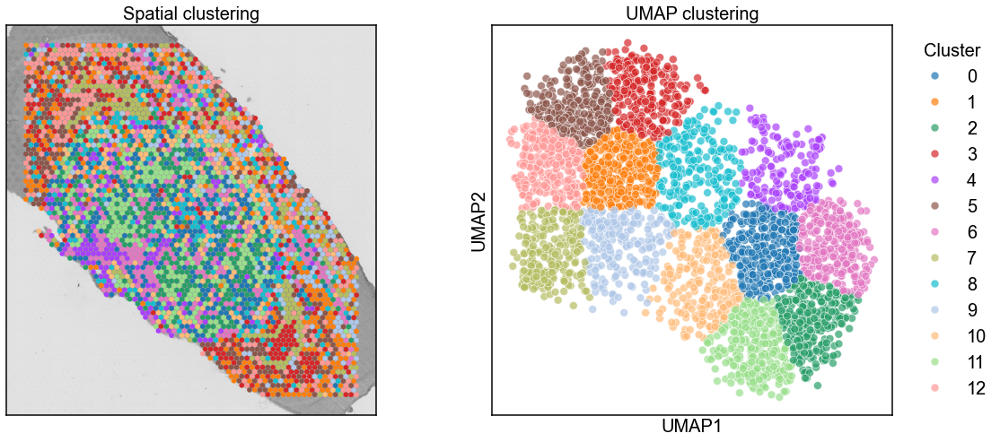

In [16]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.titlesize'] = 20

n_clusters = 13

X = adata.obsm['umap_latent_transcript']

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs['umap_based_clusters'] = clusters.astype(str)

palette = sc.pl.palettes.default_20[:n_clusters]

fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'wspace': 0.25}
)

# ======================
# Panel 1: Spatial clustering
# ======================
sc.pl.spatial(
    adata,
    color='umap_based_clusters',
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=axes[0],
    show=False,
    legend_loc=None,
    title="Spatial clustering"
)

axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('')

for spine in axes[0].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

# ======================
# Panel 2: UMAP scatter (Seaborn)
# ======================
sns.scatterplot(
    x=X[:, 0],
    y=X[:, 1],
    hue=adata.obs['umap_based_clusters'],
    palette=palette,
    s=80,
    alpha=0.7,
    ax=axes[1],
    legend='full'
)

axes[1].set_title("UMAP clustering")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
axes[1].set_xticks([])
axes[1].set_yticks([])

for spine in axes[1].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles,
    labels,
    title="Cluster",
    title_fontsize='medium',
    fontsize='medium',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)

plt.savefig(
    'ST_latent_spatial_umap.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


In [17]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
)

# Embedding used for clustering evaluation
X = adata.obsm["umap_latent_transcript"]

# Cluster assignments
labels = adata.obs["umap_based_clusters"].astype(int)

# Silhouette score
sil_score = silhouette_score(X, labels)
print(f"Silhouette Score: {sil_score:.3f}")

# Calinski–Harabasz index
ch_score = calinski_harabasz_score(X, labels)
print(f"Calinski-Harabasz Index: {ch_score:.3f}")

# Davies–Bouldin index
db_score = davies_bouldin_score(X, labels)
print(f"Davies-Bouldin Index: {db_score:.3f}")

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Filter out spots with missing RegionLoupe annotations
valid_idx = adata_filtered.obs["RegionLoupe"].notnull()

# Agreement with region annotations
ARI_region = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_region = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

# Agreement with cell-type annotations
ARI_celltype = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_celltype = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

print(f"Region ARI: {ARI_region:.3f}, NMI: {NMI_region:.3f}")
print(f"Cell type ARI: {ARI_celltype:.3f}, NMI: {NMI_celltype:.3f}")


Silhouette Score: 0.357
Calinski-Harabasz Index: 4502.280
Davies-Bouldin Index: 0.820
Region ARI: 0.107, NMI: 0.219
Cell type ARI: 0.129, NMI: 0.249


## SM latent embedding

/Users/dubingxue/opt/anaconda3/envs/transcript/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


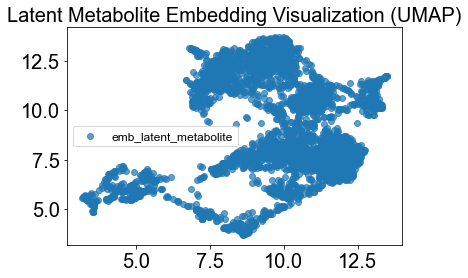

In [18]:
# Initialize the UMAP reducer
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Perform UMAP dimensionality reduction
reduced_latent_metabolite_umap = umap_reducer.fit_transform(emb_latent_metabolite)

# Plot the UMAP embedding
plt.scatter(
    reduced_latent_metabolite_umap[:, 0],
    reduced_latent_metabolite_umap[:, 1],
    label="emb_latent_metabolite",
    alpha=0.7
)
plt.legend()
plt.title("Latent Metabolite Embedding Visualization (UMAP)")
plt.show()

# Store the UMAP embedding in adata if needed
adata = adata_filtered
adata.obsm["umap_latent_metabolite"] = reduced_latent_metabolite_umap


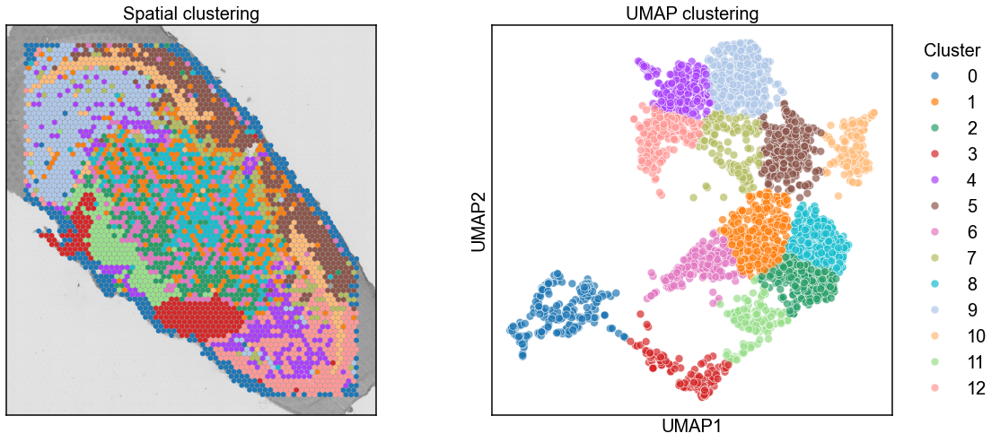

In [19]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.titlesize'] = 20

n_clusters = 13


X = adata.obsm['umap_latent_metabolite']

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs['umap_based_clusters'] = clusters.astype(str)

palette = sc.pl.palettes.default_20[:n_clusters]


fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'wspace': 0.25}
)

# ======================
# Panel 1: Spatial clustering
# ======================
sc.pl.spatial(
    adata,
    color='umap_based_clusters',
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=axes[0],
    show=False,
    legend_loc=None,
    title="Spatial clustering"
)

axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('')

for spine in axes[0].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

# ======================
# Panel 2: UMAP scatter (Seaborn)
# ======================

sns.scatterplot(
    x=X[:, 0],
    y=X[:, 1],
    hue=adata.obs['umap_based_clusters'],
    palette=palette,
    s=80,
    alpha=0.7,
    ax=axes[1],
    legend='full'
)

axes[1].set_title("UMAP clustering")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
axes[1].set_xticks([])
axes[1].set_yticks([])

for spine in axes[1].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles,
    labels,
    title="Cluster",
    title_fontsize='medium',
    fontsize='medium',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)


plt.savefig(
    'SM_latent_spatial_umap.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


In [20]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
)

# Embedding used for clustering evaluation
X = adata.obsm["umap_latent_metabolite"]

# Cluster assignments
labels = adata.obs["umap_based_clusters"].astype(int)

# Silhouette score
sil_score = silhouette_score(X, labels)
print(f"Silhouette Score: {sil_score:.3f}")

# Calinski–Harabasz index
ch_score = calinski_harabasz_score(X, labels)
print(f"Calinski-Harabasz Index: {ch_score:.3f}")

# Davies–Bouldin index
db_score = davies_bouldin_score(X, labels)
print(f"Davies-Bouldin Index: {db_score:.3f}")

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Filter out spots with missing RegionLoupe annotations
valid_idx = adata_filtered.obs["RegionLoupe"].notnull()

# Agreement with region annotations
ARI_region = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_region = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

# Agreement with cell-type annotations
ARI_celltype = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_celltype = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

print(f"Region ARI: {ARI_region:.3f}, NMI: {NMI_region:.3f}")
print(f"Cell type ARI: {ARI_celltype:.3f}, NMI: {NMI_celltype:.3f}")


Silhouette Score: 0.463
Calinski-Harabasz Index: 6074.858
Davies-Bouldin Index: 0.746
Region ARI: 0.204, NMI: 0.349
Cell type ARI: 0.097, NMI: 0.205


## SHINE letent embedding

/Users/dubingxue/opt/anaconda3/envs/transcript/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


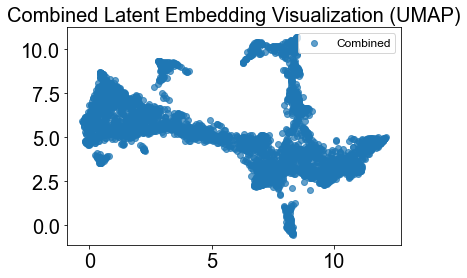

In [21]:
# Initialize the UMAP reducer
umap_reducer = umap.UMAP(n_components=2, random_state=42)

# Perform UMAP dimensionality reduction on the combined latent embedding
reduced_combined_umap = umap_reducer.fit_transform(emb_combined)

# Plot the UMAP embedding
plt.scatter(
    reduced_combined_umap[:, 0],
    reduced_combined_umap[:, 1],
    label="Combined",
    alpha=0.7
)
plt.legend()
plt.title("Combined Latent Embedding Visualization (UMAP)")
plt.show()

# Store the UMAP embedding in the AnnData object if needed
adata = adata_filtered
adata.obsm["umap_combined"] = reduced_combined_umap


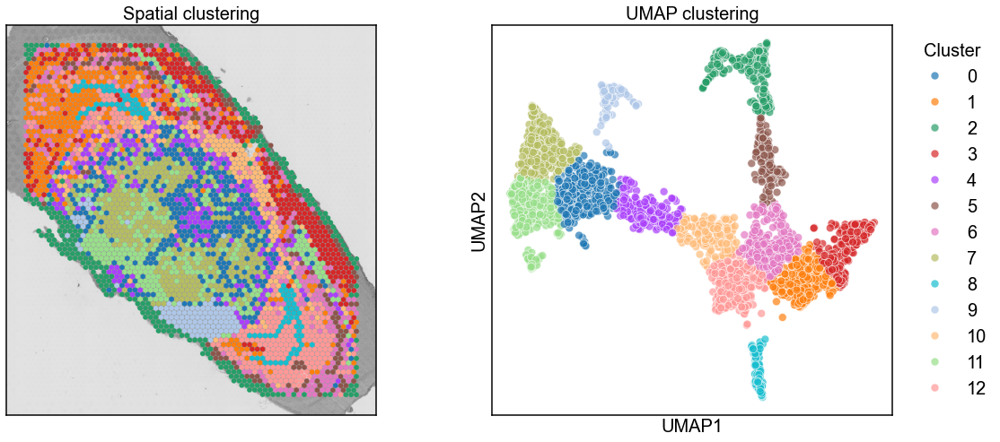

In [22]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.titlesize'] = 20

n_clusters = 13

X = adata.obsm['umap_combined']

kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs['umap_based_clusters'] = clusters.astype(str)

palette = sc.pl.palettes.default_20[:n_clusters]

fig, axes = plt.subplots(
    1, 2,
    figsize=(18, 8),
    gridspec_kw={'wspace': 0.25}
)

# ======================
# Panel 1: Spatial clustering
# ======================
sc.pl.spatial(
    adata,
    color='umap_based_clusters',
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=axes[0],
    show=False,
    legend_loc=None,
    title="Spatial clustering"
)

axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_xlabel('')
axes[0].set_ylabel('')

for spine in axes[0].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

# ======================
# Panel 2: UMAP scatter (Seaborn)
# ======================
sns.scatterplot(
    x=X[:, 0],
    y=X[:, 1],
    hue=adata.obs['umap_based_clusters'],
    palette=palette,
    s=80,
    alpha=0.7,
    ax=axes[1],
    legend='full'
)

axes[1].set_title("UMAP clustering")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
axes[1].set_xticks([])
axes[1].set_yticks([])

for spine in axes[1].spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)

handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles,
    labels,
    title="Cluster",
    title_fontsize='medium',
    fontsize='medium',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)

plt.savefig(
    'SHINE_latent_spatial_umap.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()


<ipython-input-23-d941e5e5b3d4>:58: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


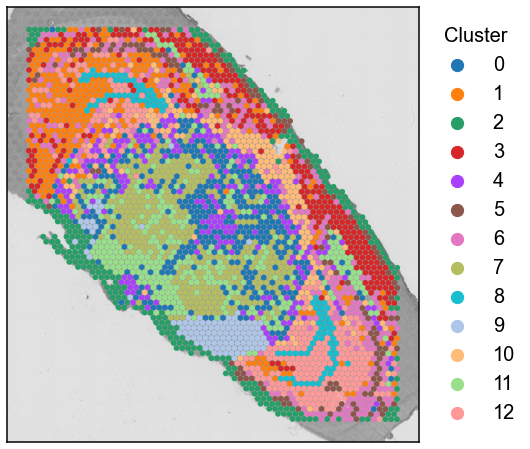

In [23]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Set font family and font sizes
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 20

# Number of clusters
n_clusters = 13

# Perform clustering
X = adata.obsm["umap_combined"]
# kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init="auto")
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
adata.obs["umap_based_clusters"] = clusters.astype(str)

# Define color palette
palette = sc.pl.palettes.default_20[:n_clusters]

# Create figure and axis
fig, ax = plt.subplots(figsize=(9, 8))

# Spatial visualization with grayscale background and adjusted transparency
sc.pl.spatial(
    adata,
    color="umap_based_clusters",
    palette=palette,
    size=1.5,
    bw=True,
    alpha_img=0.6,
    ax=ax,
    show=False,
    legend_loc="right margin",
    legend_fontsize="medium",
    title=""
)

# Remove axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("")
ax.set_ylabel("")

# Draw a clear outer frame
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color("black")

# Manually increase the size of colored dots in the legend
legend = ax.get_legend()
if legend is not None:
    legend.set_title("Cluster")
    legend.get_title().set_fontsize("medium")
    for handle in legend.legendHandles:
        handle.set_sizes([150])  # Increase marker size in the legend

# Save the figure (vector format recommended for publication)
plt.savefig("SHINE.svg", format="svg", bbox_inches="tight")

# Display the figure
plt.show()


In [24]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score,
)

# Embedding used for clustering evaluation
X = adata.obsm["umap_combined"]

# Cluster assignments
labels = adata.obs["umap_based_clusters"].astype(int)

# Silhouette score
sil_score = silhouette_score(X, labels)
print(f"Silhouette Score: {sil_score:.3f}")

# Calinski–Harabasz index
ch_score = calinski_harabasz_score(X, labels)
print(f"Calinski-Harabasz Index: {ch_score:.3f}")

# Davies–Bouldin index
db_score = davies_bouldin_score(X, labels)
print(f"Davies-Bouldin Index: {db_score:.3f}")

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Filter out spots with missing RegionLoupe annotations
valid_idx = adata_filtered.obs["RegionLoupe"].notnull()

# Agreement with region annotations
ARI_region = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_region = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "RegionLoupe"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

# Agreement with cell-type annotations
ARI_celltype = adjusted_rand_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)
NMI_celltype = normalized_mutual_info_score(
    adata_filtered.obs.loc[valid_idx, "Cell type"],
    adata_filtered.obs.loc[valid_idx, "umap_based_clusters"],
)

print(f"Region ARI: {ARI_region:.3f}, NMI: {NMI_region:.3f}")
print(f"Cell type ARI: {ARI_celltype:.3f}, NMI: {NMI_celltype:.3f}")


Silhouette Score: 0.491
Calinski-Harabasz Index: 9177.443
Davies-Bouldin Index: 0.622
Region ARI: 0.207, NMI: 0.340
Cell type ARI: 0.179, NMI: 0.329


# Downstream analysis

## Marker genes and metabolites

In [28]:
import pandas as pd
import scanpy as sc

# Assumptions:
# df_genes: spot × genes DataFrame (containing columns: spot, x, y, gene1, gene2, ...)
# df_mets:  spot × metabolites DataFrame (containing columns: spot, x, y, met1, met2, ...)

# Load aligned spatial transcriptomics and metabolomics data
df_genes = pd.read_csv("aligned_ST_data.csv")
df_mets = pd.read_csv("aligned_SM_data.csv")

# Verify that spot identifiers are identical and in the same order
assert (df_genes["spot"] == df_mets["spot"]).all(), "Spot identifiers do not match!"

# Set spot as index for alignment
df_genes.set_index("spot", inplace=True)
df_mets.set_index("spot", inplace=True)

# Remove spatial coordinate columns and keep only expression features
genes_expr = df_genes.drop(columns=["x", "y"])
mets_expr = df_mets.drop(columns=["x", "y"])

# Add a prefix to metabolite feature names for clarity
mets_expr.columns = ["met_" + col for col in mets_expr.columns]

# Concatenate gene and metabolite expression matrices
combined_expr = pd.concat([genes_expr, mets_expr], axis=1)

# Inspect the integrated feature matrix
print(combined_expr.head())

# Update the existing AnnData object
# Assume adata.obs_names are consistent with combined_expr.index
adata = adata[combined_expr.index, :].copy()  # ensure consistent spot ordering

# Replace expression matrix with the integrated features
adata = sc.AnnData(
    X=combined_expr.values,
    obs=adata.obs,
    var=pd.DataFrame(index=combined_expr.columns)
)

# Re-attach spatial coordinates
adata.obs["x"] = df_genes["x"]
adata.obs["y"] = df_genes["y"]

# Optionally recompute basic QC metrics
sc.pp.calculate_qc_metrics(adata, inplace=True)

# Inspect the updated AnnData object
print(adata)


                         Vxn  Cops5  ...  met_1048.34354  met_1048.38431
spot                                 ...                                
AAACAACGAATAGTTC-1  0.000000    0.0  ...             0.0        1.303770
AAACAAGTATCTCCCA-1  1.440226    0.0  ...             0.0        1.224556
AAACAATCTACTAGCA-1  1.904967    0.0  ...             0.0        0.742537
AAACAGCTTTCAGAAG-1  0.000000    0.0  ...             0.0        0.436550
AAACATTTCCCGGATT-1  0.971550    0.0  ...             0.0        1.132240

[5 rows x 3538 columns]
AnnData object with n_obs × n_vars = 3355 × 3538
    obs: 'in_tissue', 'array_row', 'array_col', 'latent_combined_1', 'latent_combined_2', 'latent_combined_3', 'latent_combined_4', 'latent_combined_5', 'latent_combined_6', 'latent_combined_7', 'latent_combined_8', 'latent_combined_9', 'latent_combined_10', 'latent_combined_11', 'latent_combined_12', 'latent_combined_13', 'latent_combined_14', 'latent_combined_15', 'latent_combined_16', 'latent_combined_17', 'l

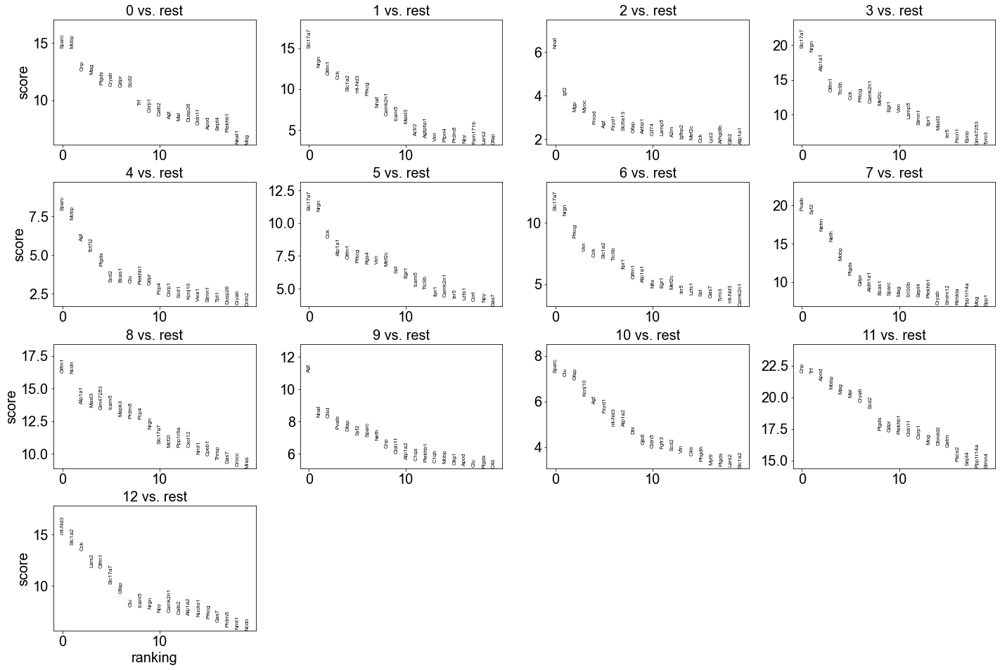

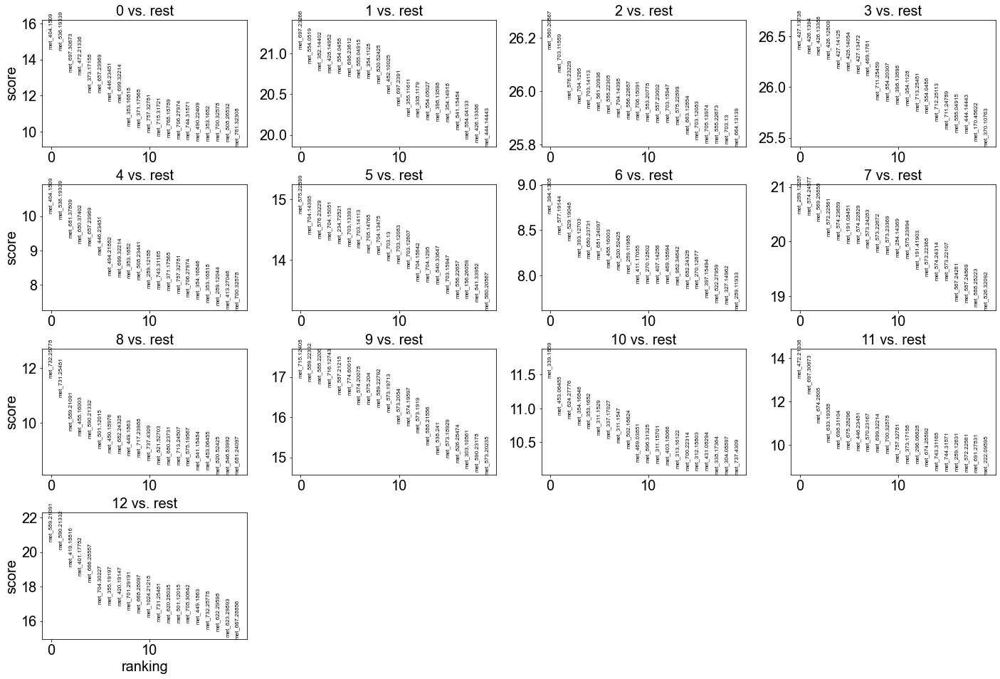

In [29]:

genes_only = adata[:, ~adata.var_names.str.startswith('met_')].copy()
sc.tl.rank_genes_groups(genes_only, 'umap_based_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(genes_only, n_genes=20, title='gene Marker', sharey=False)


metabolites_only = adata[:, adata.var_names.str.startswith('met_')].copy()

sc.tl.rank_genes_groups(metabolites_only, 'umap_based_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(metabolites_only, n_genes=20, title='metabolite Marker', sharey=False)


In [30]:
# Extract differential gene expression results
result = genes_only.uns["rank_genes_groups"]

# Specify the cluster of interest
cluster_of_interest = "7"

# Extract marker genes for the selected cluster and rank by FDR (adjusted p-values)
marker_genes = pd.DataFrame({
    "gene": result["names"][cluster_of_interest],
    "pvals_adj": result["pvals_adj"][cluster_of_interest],  # FDR-adjusted p-values
    "logfoldchanges": result["logfoldchanges"][cluster_of_interest],
    "scores": result["scores"][cluster_of_interest],
})

# Sort by FDR and select the top 300 most significant genes
top_marker_genes = marker_genes.sort_values(by="pvals_adj").head(300)

top_marker_genes.reset_index(drop=True, inplace=True)

# Save the full marker gene table to a CSV file
top_marker_genes.to_csv("cluster7_marker_300genes.csv", index=False)

# Alternatively, save only gene names for enrichment analysis
top_marker_genes[["gene"]].to_csv(
    "cluster7_marker_300genes_list.txt",
    index=False,
    header=False
)

# Display the results
print(top_marker_genes)


        gene     pvals_adj  logfoldchanges     scores
0       Nrgn  5.740389e-80       -3.767260 -19.332354
1      Pvalb  6.343207e-80        2.649077  19.291401
2       Syt2  1.378091e-76        2.971517  18.868597
3    Slc17a7  2.413292e-61       -6.225133 -16.895857
4       Nefm  1.541821e-59        2.244834  16.635511
..       ...           ...             ...        ...
295  Pomgnt1  8.352688e-01       -0.518934  -1.541283
296   Phf21a  8.440949e-01       -0.546343  -1.530168
297    Evi2a  8.440949e-01        0.555651   1.529292
298    Poc1a  8.440949e-01       -1.334609  -1.530649
299   Slc9a5  8.499195e-01        0.566472   1.515631

[300 rows x 4 columns]


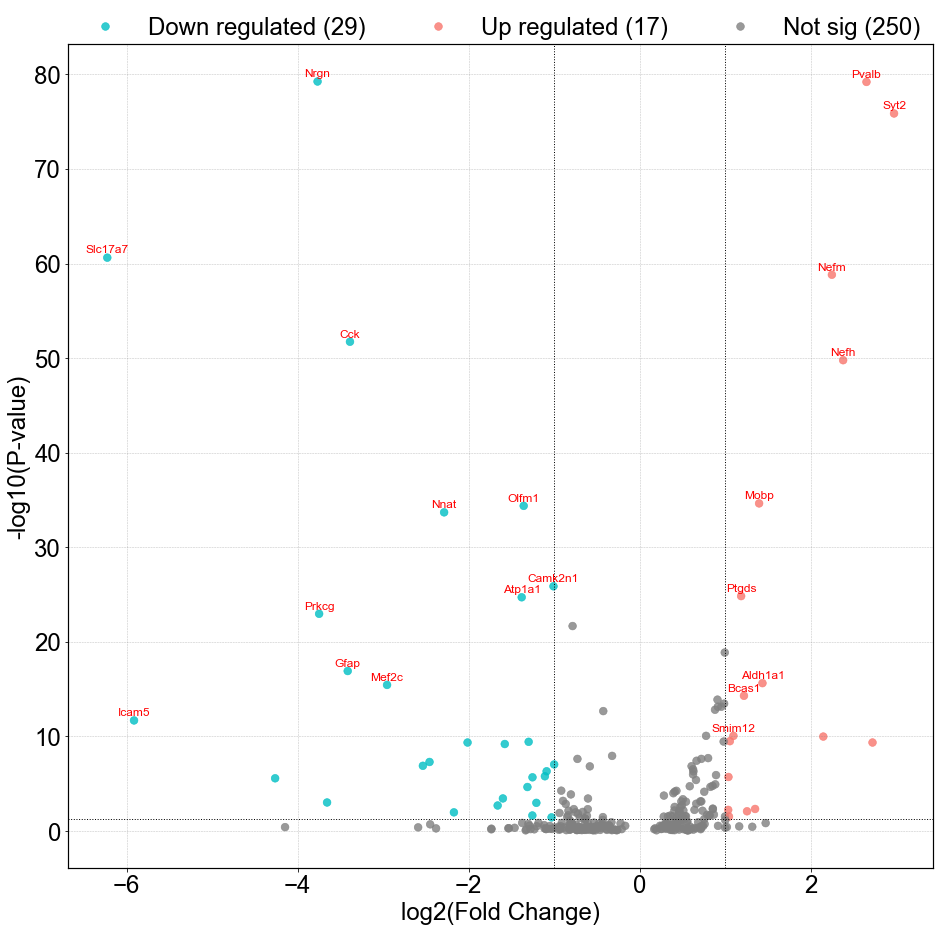

In [31]:
# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_genes_cluster7 = pd.read_csv('cluster7_marker_300genes.csv')

# Remove extreme outliers in log fold change
top_marker_genes_cluster7 = top_marker_genes_cluster7[
    (top_marker_genes_cluster7['logfoldchanges'] > -10) &
    (top_marker_genes_cluster7['logfoldchanges'] < 10)
]

# Compute -log10(adjusted p-value)
top_marker_genes_cluster7['neg_log10_padj'] = -np.log10(
    top_marker_genes_cluster7['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_genes_cluster7['significance'] = 'Not sig'
top_marker_genes_cluster7.loc[
    (top_marker_genes_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster7['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_genes_cluster7.loc[
    (top_marker_genes_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster7['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of genes in each category
sig_counts = top_marker_genes_cluster7['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_genes_cluster7,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant genes
# ---------------------------------------------------------
top_genes = top_marker_genes_cluster7[
    (top_marker_genes_cluster7['pvals_adj'] < 0.05) &
    (abs(top_marker_genes_cluster7['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_genes.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['gene'],
        fontsize=12,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano-cluster7-gene.svg', format='svg', bbox_inches='tight')
plt.show()


In [34]:
import pandas as pd

# ---------------------------------------------------------
# Extract differential metabolite analysis results
# ---------------------------------------------------------
result = metabolites_only.uns['rank_genes_groups']

# Specify the cluster of interest (e.g., cluster '7')
cluster_of_interest = '7'

# Extract significantly enriched metabolites for the target cluster
# (ranked by p-value by default)
marker_metabolites = pd.DataFrame({
    'metabolite': result['names'][cluster_of_interest],
    # 'pvals': result['pvals'][cluster_of_interest],
    'pvals_adj': result['pvals_adj'][cluster_of_interest],  # FDR-adjusted p-values
    'logfoldchanges': result['logfoldchanges'][cluster_of_interest],
    'scores': result['scores'][cluster_of_interest]
})

# Select the top N significant metabolites
top_marker_metabolites = marker_metabolites.head(300)  # adjust N based on dataset size

# Save full results to file
top_marker_metabolites.to_csv(
    'cluster7_marker_metabolites.csv',
    index=False
)

# Save metabolite names only
top_marker_metabolites[['metabolite']].to_csv(
    'cluster7_marker_metabolite_list.txt',
    index=False,
    header=False
)


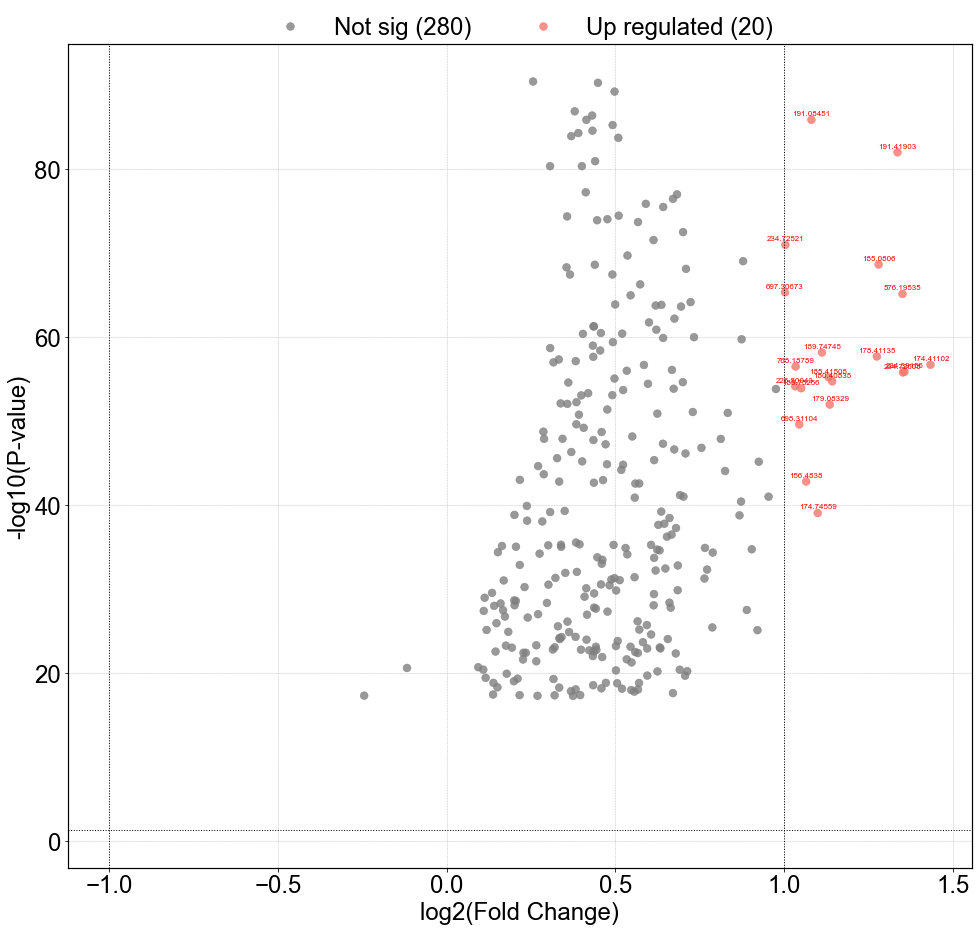

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_metabolites_cluster7 = pd.read_csv('cluster7_marker_metabolites.csv')

# Remove extreme outliers in log fold change
top_marker_metabolites_cluster7 = top_marker_metabolites_cluster7[
    (top_marker_metabolites_cluster7['logfoldchanges'] > -10) &
    (top_marker_metabolites_cluster7['logfoldchanges'] < 10)
]

# Remove 'met_' prefix from metabolite names
top_marker_metabolites_cluster7['metabolite'] = (
    top_marker_metabolites_cluster7['metabolite']
    .str.replace('^met_', '', regex=True)
)

# Compute -log10(adjusted p-value)
top_marker_metabolites_cluster7['neg_log10_padj'] = -np.log10(
    top_marker_metabolites_cluster7['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_metabolites_cluster7['significance'] = 'Not sig'
top_marker_metabolites_cluster7.loc[
    (top_marker_metabolites_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster7['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_metabolites_cluster7.loc[
    (top_marker_metabolites_cluster7['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster7['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of metabolites in each category
sig_counts = top_marker_metabolites_cluster7['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_metabolites_cluster7,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant metabolites
# ---------------------------------------------------------
top_metabolites = top_marker_metabolites_cluster7[
    (top_marker_metabolites_cluster7['pvals_adj'] < 0.05) &
    (abs(top_marker_metabolites_cluster7['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_metabolites.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['metabolite'],
        fontsize=8,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano_metabolites_cluster7.svg', format='svg', bbox_inches='tight')
plt.show()


In [36]:
import pandas as pd

# Extract differential gene expression results
result = genes_only.uns["rank_genes_groups"]

# Specify the cluster of interest
cluster_of_interest = "9"

# Extract marker genes for the selected cluster and rank by FDR (adjusted p-values)
marker_genes = pd.DataFrame({
    "gene": result["names"][cluster_of_interest],
    "pvals_adj": result["pvals_adj"][cluster_of_interest],  # FDR-adjusted p-values
    "logfoldchanges": result["logfoldchanges"][cluster_of_interest],
    "scores": result["scores"][cluster_of_interest],
})

# Sort by FDR and select the top 300 most significant genes
top_marker_genes = marker_genes.sort_values(by="pvals_adj").head(300)

top_marker_genes.reset_index(drop=True, inplace=True)

# Save the full marker gene table to a CSV file
top_marker_genes.to_csv("cluster9_marker_300genes.csv", index=False)

# Alternatively, save only gene names for enrichment analysis
top_marker_genes[["gene"]].to_csv(
    "cluster9_marker_300genes_list.txt",
    index=False,
    header=False
)

# Display the results
print(top_marker_genes)


        gene     pvals_adj  logfoldchanges     scores
0        Agt  6.038137e-25        2.532641  11.021230
1       Nrgn  6.953248e-21       -3.376681 -10.077414
2        Cck  8.687162e-16       -3.747131  -8.773146
3    Slc17a7  8.687162e-16       -5.731951  -8.797146
4       Nnat  4.316922e-14        1.755628   8.295727
..       ...           ...             ...        ...
295  Osbpl10  9.994529e-01      -21.821014  -0.061961
296   Pex11g  9.994529e-01      -22.207579  -0.061961
297     Aoc3  9.994529e-01      -22.272831  -0.061961
298  Gm48283  9.994529e-01      -21.761612  -0.061961
299     Tslp  9.994529e-01      -22.049644  -0.061961

[300 rows x 4 columns]


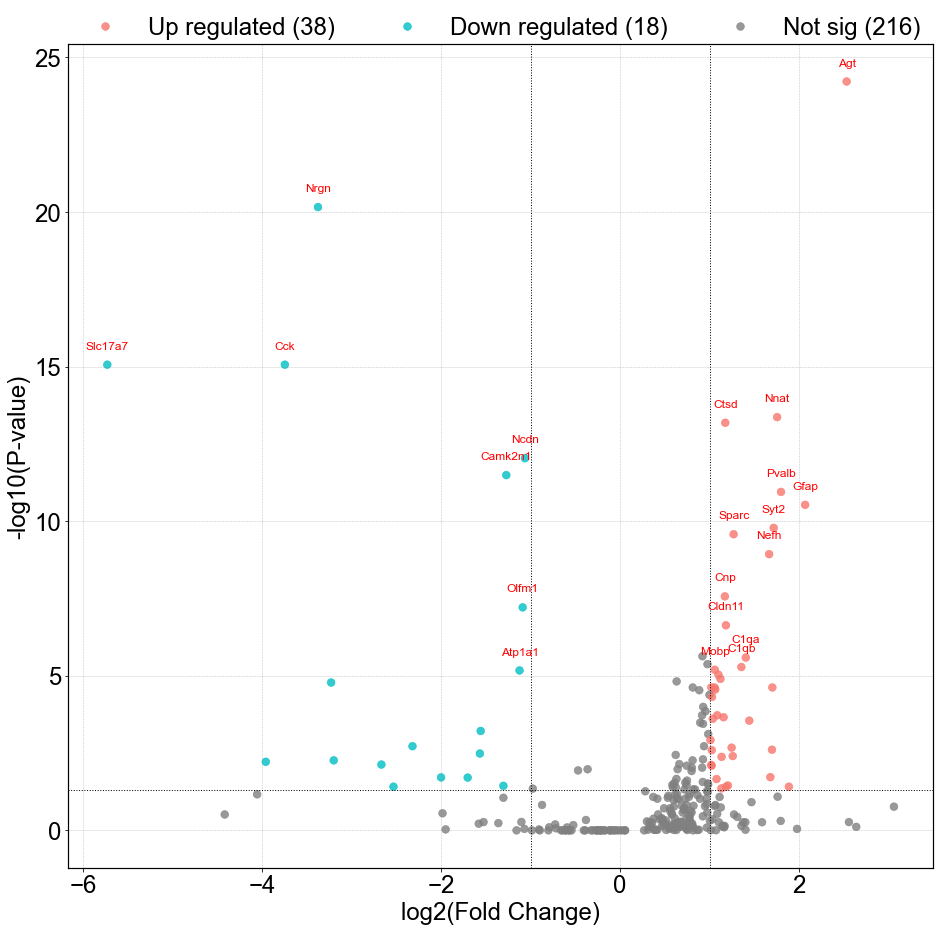

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_genes_cluster9 = pd.read_csv('cluster9_marker_300genes.csv')

# Remove extreme outliers in log fold change
top_marker_genes_cluster9 = top_marker_genes_cluster9[
    (top_marker_genes_cluster9['logfoldchanges'] > -10) &
    (top_marker_genes_cluster9['logfoldchanges'] < 10)
]

# Compute -log10(adjusted p-value)
top_marker_genes_cluster9['neg_log10_padj'] = -np.log10(
    top_marker_genes_cluster9['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_genes_cluster9['significance'] = 'Not sig'
top_marker_genes_cluster9.loc[
    (top_marker_genes_cluster9['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster9['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_genes_cluster9.loc[
    (top_marker_genes_cluster9['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster9['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of genes in each category
sig_counts = top_marker_genes_cluster9['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_genes_cluster9,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant genes
# ---------------------------------------------------------
top_genes = top_marker_genes_cluster9[
    (top_marker_genes_cluster9['pvals_adj'] < 0.05) &
    (abs(top_marker_genes_cluster9['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_genes.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['gene'],
        fontsize=12,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano-cluster9-gene.svg', format='svg', bbox_inches='tight')
plt.show()


In [38]:
import pandas as pd

# ---------------------------------------------------------
# Extract differential metabolite analysis results
# ---------------------------------------------------------
result = metabolites_only.uns['rank_genes_groups']

# Specify the cluster of interest (e.g., cluster '9')
cluster_of_interest = '9'

# Extract significantly enriched metabolites for the target cluster
# (ranked by p-value by default)
marker_metabolites = pd.DataFrame({
    'metabolite': result['names'][cluster_of_interest],
    # 'pvals': result['pvals'][cluster_of_interest],
    'pvals_adj': result['pvals_adj'][cluster_of_interest],  # FDR-adjusted p-values
    'logfoldchanges': result['logfoldchanges'][cluster_of_interest],
    'scores': result['scores'][cluster_of_interest]
})

# Select the top N significant metabolites
top_marker_metabolites = marker_metabolites.head(300)  # adjust N based on dataset size

# Save full results to file
top_marker_metabolites.to_csv(
    'cluster9_marker_metabolites.csv',
    index=False
)

# Save metabolite names only
top_marker_metabolites[['metabolite']].to_csv(
    'cluster9_marker_metabolite_list.txt',
    index=False,
    header=False
)


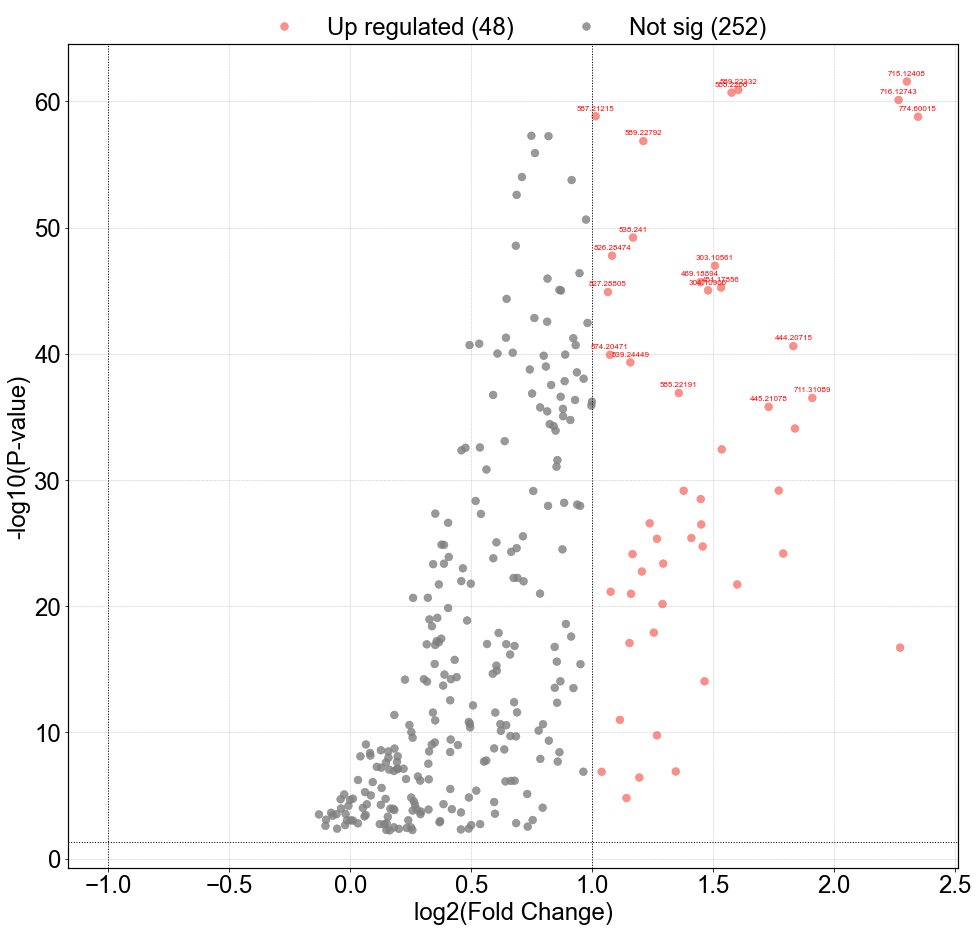

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_metabolites_cluster9 = pd.read_csv('cluster9_marker_metabolites.csv')

# Remove extreme outliers in log fold change
top_marker_metabolites_cluster9 = top_marker_metabolites_cluster9[
    (top_marker_metabolites_cluster9['logfoldchanges'] > -10) &
    (top_marker_metabolites_cluster9['logfoldchanges'] < 10)
]

# Remove 'met_' prefix from metabolite names
top_marker_metabolites_cluster9['metabolite'] = (
    top_marker_metabolites_cluster9['metabolite']
    .str.replace('^met_', '', regex=True)
)

# Compute -log10(adjusted p-value)
top_marker_metabolites_cluster9['neg_log10_padj'] = -np.log10(
    top_marker_metabolites_cluster9['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_metabolites_cluster9['significance'] = 'Not sig'
top_marker_metabolites_cluster9.loc[
    (top_marker_metabolites_cluster9['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster9['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_metabolites_cluster9.loc[
    (top_marker_metabolites_cluster9['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster9['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of metabolites in each category
sig_counts = top_marker_metabolites_cluster9['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_metabolites_cluster9,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant metabolites
# ---------------------------------------------------------
top_metabolites = top_marker_metabolites_cluster9[
    (top_marker_metabolites_cluster9['pvals_adj'] < 0.05) &
    (abs(top_marker_metabolites_cluster9['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_metabolites.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['metabolite'],
        fontsize=8,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano_metabolites_cluster9.svg', format='svg', bbox_inches='tight')
plt.show()


In [41]:
import pandas as pd

# Extract differential gene expression results
result = genes_only.uns["rank_genes_groups"]

# Specify the cluster of interest
cluster_of_interest = "11"

# Extract marker genes for the selected cluster and rank by FDR (adjusted p-values)
marker_genes = pd.DataFrame({
    "gene": result["names"][cluster_of_interest],
    "pvals_adj": result["pvals_adj"][cluster_of_interest],  # FDR-adjusted p-values
    "logfoldchanges": result["logfoldchanges"][cluster_of_interest],
    "scores": result["scores"][cluster_of_interest],
})

# Sort by FDR and select the top 300 most significant genes
top_marker_genes = marker_genes.sort_values(by="pvals_adj").head(300)

top_marker_genes.reset_index(drop=True, inplace=True)

# Save the full marker gene table to a CSV file
top_marker_genes.to_csv("cluster11_marker_300genes.csv", index=False)

# Alternatively, save only gene names for enrichment analysis
top_marker_genes[["gene"]].to_csv(
    "cluster11_marker_300genes_list.txt",
    index=False,
    header=False
)

# Display the results
print(top_marker_genes)


        gene      pvals_adj  logfoldchanges     scores
0        Cnp  1.325397e-103        2.664650  21.962162
1        Trf  2.802749e-103        2.913584  21.896540
2       Apod   1.921599e-97        2.930854  21.256304
3       Mobp   4.393341e-92        2.390901  20.655085
4        Mag   7.466240e-89        2.750418  20.281677
..       ...            ...             ...        ...
295    Erbin   2.200959e-01        0.955825   2.137293
296   Tmeff2   2.211212e-01        0.694773   2.134077
297    Abcc5   2.224141e-01       -0.435258  -2.129040
298     Sbf1   2.224141e-01        0.482921   2.129223
299  Tspan15   2.257707e-01        1.149552   2.121668

[300 rows x 4 columns]


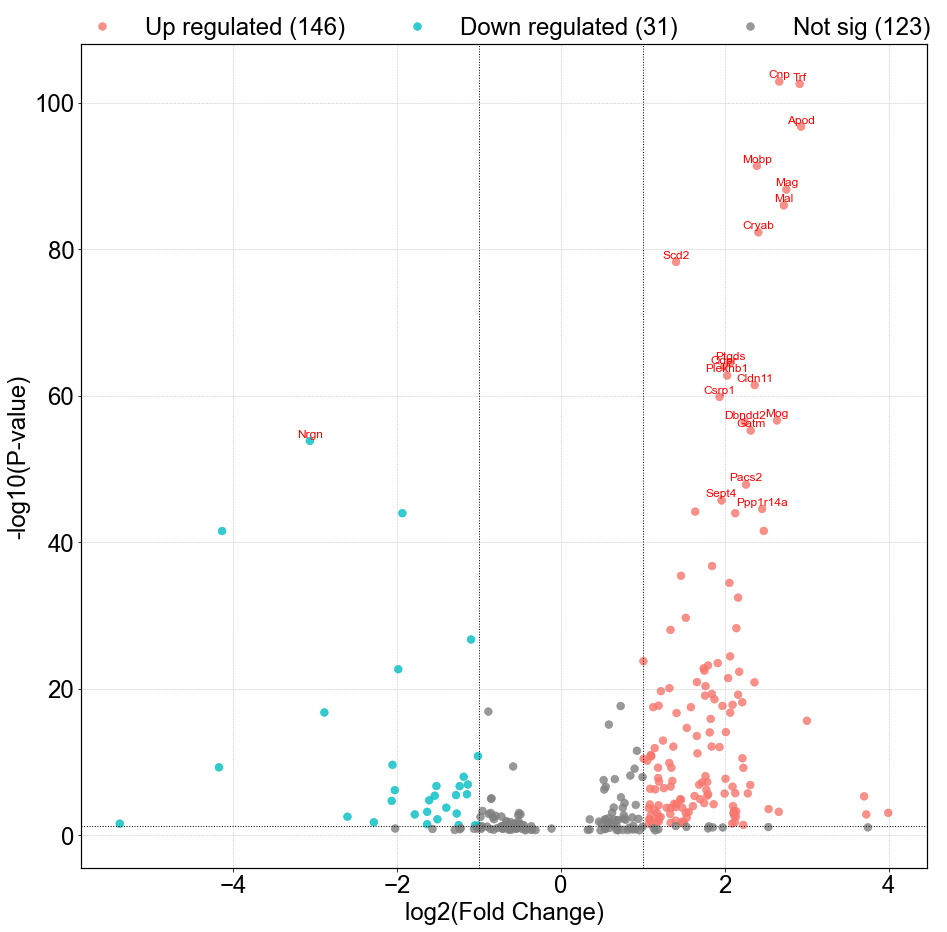

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_genes_cluster11 = pd.read_csv('cluster11_marker_300genes.csv')

# Remove extreme outliers in log fold change
top_marker_genes_cluster11 = top_marker_genes_cluster11[
    (top_marker_genes_cluster11['logfoldchanges'] > -10) &
    (top_marker_genes_cluster11['logfoldchanges'] < 10)
]

# Compute -log10(adjusted p-value)
top_marker_genes_cluster11['neg_log10_padj'] = -np.log10(
    top_marker_genes_cluster11['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_genes_cluster11['significance'] = 'Not sig'
top_marker_genes_cluster11.loc[
    (top_marker_genes_cluster11['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster11['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_genes_cluster11.loc[
    (top_marker_genes_cluster11['pvals_adj'] < p_threshold) &
    (top_marker_genes_cluster11['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of genes in each category
sig_counts = top_marker_genes_cluster11['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_genes_cluster11,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant genes
# ---------------------------------------------------------
top_genes = top_marker_genes_cluster11[
    (top_marker_genes_cluster11['pvals_adj'] < 0.05) &
    (abs(top_marker_genes_cluster11['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_genes.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['gene'],
        fontsize=12,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano-cluster11-gene.svg', format='svg', bbox_inches='tight')
plt.show()


In [43]:
import pandas as pd

# ---------------------------------------------------------
# Extract differential metabolite analysis results
# ---------------------------------------------------------
result = metabolites_only.uns['rank_genes_groups']

# Specify the cluster of interest (e.g., cluster '11')
cluster_of_interest = '11'

# Extract significantly enriched metabolites for the target cluster
# (ranked by p-value by default)
marker_metabolites = pd.DataFrame({
    'metabolite': result['names'][cluster_of_interest],
    # 'pvals': result['pvals'][cluster_of_interest],
    'pvals_adj': result['pvals_adj'][cluster_of_interest],  # FDR-adjusted p-values
    'logfoldchanges': result['logfoldchanges'][cluster_of_interest],
    'scores': result['scores'][cluster_of_interest]
})

# Select the top N significant metabolites
top_marker_metabolites = marker_metabolites.head(300)  # adjust N based on dataset size

# Save full results to file
top_marker_metabolites.to_csv(
    'cluster11_marker_metabolites.csv',
    index=False
)

# Save metabolite names only
top_marker_metabolites[['metabolite']].to_csv(
    'cluster11_marker_metabolite_list.txt',
    index=False,
    header=False
)


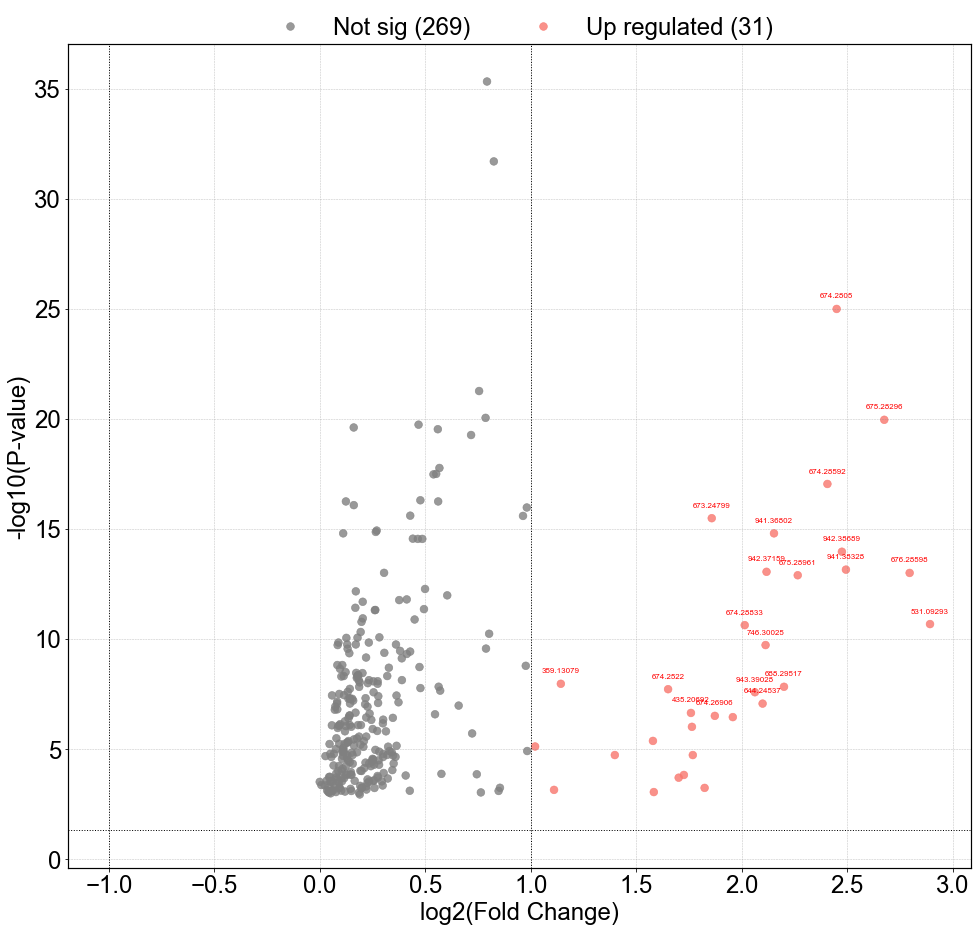

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Explicitly set font to Arial
plt.rcParams['font.family'] = 'Arial'

# ---------------------------------------------------------
# Load data
# ---------------------------------------------------------
top_marker_metabolites_cluster11 = pd.read_csv('cluster11_marker_metabolites.csv')

# Remove extreme outliers in log fold change
top_marker_metabolites_cluster11 = top_marker_metabolites_cluster11[
    (top_marker_metabolites_cluster11['logfoldchanges'] > -10) &
    (top_marker_metabolites_cluster11['logfoldchanges'] < 10)
]

# Remove 'met_' prefix from metabolite names
top_marker_metabolites_cluster11['metabolite'] = (
    top_marker_metabolites_cluster11['metabolite']
    .str.replace('^met_', '', regex=True)
)

# Compute -log10(adjusted p-value)
top_marker_metabolites_cluster11['neg_log10_padj'] = -np.log10(
    top_marker_metabolites_cluster11['pvals_adj']
)

# ---------------------------------------------------------
# Define significance thresholds
# ---------------------------------------------------------
logfc_threshold = 1.0
p_threshold = 0.05

# Assign significance categories
top_marker_metabolites_cluster11['significance'] = 'Not sig'
top_marker_metabolites_cluster11.loc[
    (top_marker_metabolites_cluster11['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster11['logfoldchanges'] >= logfc_threshold),
    'significance'
] = 'Up regulated'
top_marker_metabolites_cluster11.loc[
    (top_marker_metabolites_cluster11['pvals_adj'] < p_threshold) &
    (top_marker_metabolites_cluster11['logfoldchanges'] <= -logfc_threshold),
    'significance'
] = 'Down regulated'

# Count the number of metabolites in each category
sig_counts = top_marker_metabolites_cluster11['significance'].value_counts()

# Define color palette
palette = {
    'Up regulated': '#F8766D',
    'Down regulated': '#00BFC4',
    'Not sig': 'grey'
}

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 14))

# Scatter plot
sns.scatterplot(
    data=top_marker_metabolites_cluster11,
    x='logfoldchanges',
    y='neg_log10_padj',
    hue='significance',
    palette=palette,
    alpha=0.8,
    edgecolor=None,
    s=60,
    ax=ax
)

# Add threshold lines
ax.axhline(-np.log10(p_threshold), linestyle=':', color='black', linewidth=1)
ax.axvline(logfc_threshold, linestyle=':', color='black', linewidth=1)
ax.axvline(-logfc_threshold, linestyle=':', color='black', linewidth=1)

# ---------------------------------------------------------
# Annotate top 20 most significant metabolites
# ---------------------------------------------------------
top_metabolites = top_marker_metabolites_cluster11[
    (top_marker_metabolites_cluster11['pvals_adj'] < 0.05) &
    (abs(top_marker_metabolites_cluster11['logfoldchanges']) >= 1)
].nsmallest(20, 'pvals_adj')

for _, row in top_metabolites.iterrows():
    ax.text(
        row['logfoldchanges'],
        row['neg_log10_padj'] + 0.5,
        row['metabolite'],
        fontsize=8,
        color='red',
        ha='center',
        font='Arial'
    )

# ---------------------------------------------------------
# Customize legend (inside, top-centered)
# ---------------------------------------------------------
handles, labels = ax.get_legend_handles_labels()
new_labels = [f'{label} ({sig_counts[label]})' for label in labels]

ax.legend(
    handles=handles,
    labels=new_labels,
    fontsize=24,
    title='',
    bbox_to_anchor=(0.5, 1.06),
    loc='upper center',
    ncol=3,
    frameon=False
)

# ---------------------------------------------------------
# Axis labels and formatting
# ---------------------------------------------------------
ax.set_xlabel('log2(Fold Change)', fontsize=24, font='Arial')
ax.set_ylabel('-log10(P-value)', fontsize=24, font='Arial')

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=24)

# Draw all spines (box frame)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.2)

# Add light grid lines
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5, color='gray')

# Set background to white
ax.set_facecolor('white')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('volcano_metabolites_cluster11.svg', format='svg', bbox_inches='tight')
plt.show()


## Key factors

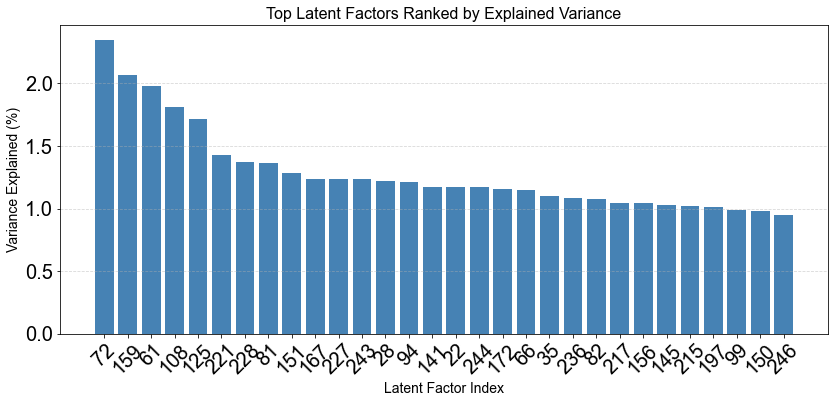

In [47]:
factor_variances = np.var(emb_combined, axis=0)

# Rank factors by variance and compute explained variance ratio
variance_ratio = factor_variances / np.sum(factor_variances)

factor_variance_df = pd.DataFrame({
    'factor_index': np.arange(len(factor_variances)),
    'variance': factor_variances,
    'variance_ratio': variance_ratio
}).sort_values('variance', ascending=False)

# ---------------------------------------------------------
# Visualize explained variance ratio of top latent factors
# ---------------------------------------------------------
plt.figure(figsize=(12, 6))
plt.bar(
    factor_variance_df['factor_index'][:30].astype(str),
    factor_variance_df['variance_ratio'][:30] * 100,
    color='steelblue'
)
plt.xlabel('Latent Factor Index', fontsize=14)
plt.ylabel('Variance Explained (%)', fontsize=14)
plt.title('Top Latent Factors Ranked by Explained Variance', fontsize=16)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [49]:
top_factors = factor_variance_df.head(20)['factor_index'].tolist()

for factor_idx in top_factors:
    factor_scores = emb_combined[:, factor_idx]
    for gene in transcript_expr.columns:
        gene_expr = transcript_expr[gene].values
        # Skip genes with all-zero expression
        if np.any(gene_expr):
            corr, p_value = spearmanr(factor_scores, gene_expr)
            gene_corr_results.append({
                'Factor': f'{factor_idx}',
                'Gene': gene,
                'Correlation': corr,
                'P_value': p_value
            })

# Convert results to DataFrame
gene_corr_df = pd.DataFrame(gene_corr_results)

# ---------------------------------------------------------
# Perform multiple testing correction (Benjamini–Hochberg FDR)
# ---------------------------------------------------------
_, gene_corr_df['FDR'], _, _ = multipletests(
    gene_corr_df['P_value'],
    method='fdr_bh'
)

# Display the first few rows of FDR-corrected results
gene_corr_df.head()


,Factor,Gene,Correlation,P_value,FDR
0,72,Vxn,0.285482,6.085684e-64,3.482508e-62
1,72,Cops5,0.049327,4.265779e-03,1.155255e-02
2,72,Prex2,0.109275,2.208285e-10,1.822769e-09
3,72,Terf1,0.050880,3.199586e-03,8.956153e-03
4,72,Fam135a,0.033967,4.914872e-02,9.679708e-02


In [50]:

met_corr_results = []

for factor_idx in top_factors:
    factor_scores = emb_combined[:, factor_idx]
    for metabolite in metabolite_abundance.columns:
        met_values = metabolite_abundance[metabolite].values
        # Skip metabolites with all-zero abundance
        if np.any(met_values):
            corr, p_value = spearmanr(factor_scores, met_values)
            met_corr_results.append({
                'Factor': f'{factor_idx}',
                'Metabolite': metabolite,
                'Correlation': corr,
                'P_value': p_value
            })

# Convert results to DataFrame
met_corr_df = pd.DataFrame(met_corr_results)

# ---------------------------------------------------------
# Perform multiple testing correction (Benjamini–Hochberg FDR)
# ---------------------------------------------------------
_, met_corr_df['FDR'], _, _ = multipletests(
    met_corr_df['P_value'],
    method='fdr_bh'
)

# Display the first few rows of FDR-corrected results
met_corr_df.head()


,Factor,Metabolite,Correlation,P_value,FDR
0,72,156.26059,-0.190006,1.215669e-28,4.123731e-28
1,72,156.26195,0.020444,2.364686e-01,2.615807e-01
2,72,156.48344,-0.192745,1.934636e-29,6.712092e-29
3,72,156.4838,-0.158238,2.963671e-20,7.834523e-20
4,72,156.485,0.043395,1.194429e-02,1.496076e-02


<ipython-input-52-312d7840ff9f>:148: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.88])


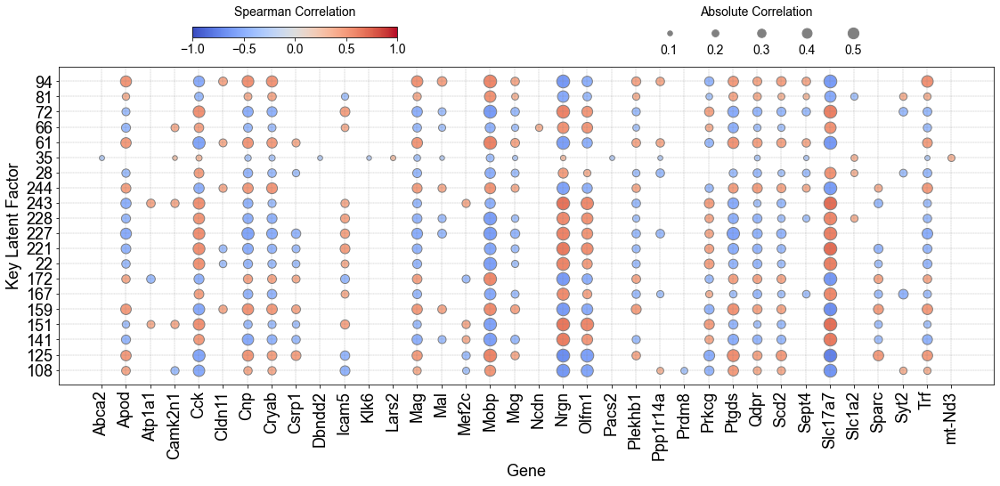

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# ---------------------------------------------------------
# Data preprocessing: retain top 20 most significant genes per factor
# ---------------------------------------------------------
top_genes_df = gene_corr_df.groupby('Factor').apply(
    lambda x: x.nsmallest(20, 'FDR')
).reset_index(drop=True)

# Generate pivot tables for correlation and FDR
pivot_corr = top_genes_df.pivot(
    index='Gene', columns='Factor', values='Correlation'
).fillna(0)

pivot_fdr = top_genes_df.pivot(
    index='Gene', columns='Factor', values='FDR'
).fillna(1)

# ---------------------------------------------------------
# Font and style settings
# ---------------------------------------------------------
font_family = 'Arial'
xlabel_fontsize = 18
ylabel_fontsize = 18
tick_fontsize = 18
cbar_fontsize = 14

fig, ax = plt.subplots(figsize=(16, 8))

# Add light grid lines
ax.grid(color='gray', linestyle='--', linewidth=0.3)

# ---------------------------------------------------------
# Bubble plot: correlation (color) and significance (size)
# ---------------------------------------------------------
for i, factor in enumerate(pivot_corr.columns):
    for j, gene in enumerate(pivot_corr.index):
        corr = pivot_corr.loc[gene, factor]
        fdr = pivot_fdr.loc[gene, factor]
        size = -np.log10(fdr + 1e-300) * 0.7

        ax.scatter(
            j, i,
            s=size,
            c=corr,
            cmap='coolwarm',
            vmin=-1, vmax=1,
            edgecolors='grey'
        )

# ---------------------------------------------------------
# Axis tick labels
# ---------------------------------------------------------
ax.set_xticks(range(len(pivot_corr.index)))
ax.set_xticklabels(
    pivot_corr.index,
    rotation=90,
    fontsize=tick_fontsize,
    fontname=font_family
)

ax.set_yticks(range(len(pivot_corr.columns)))
ax.set_yticklabels(
    pivot_corr.columns,
    fontsize=tick_fontsize,
    fontname=font_family
)

# ---------------------------------------------------------
# Colorbar for Spearman correlation
# ---------------------------------------------------------
cbar_ax = fig.add_axes([0.2, 0.9, 0.2, 0.02])  # Adjust position as needed
cbar = fig.colorbar(
    plt.cm.ScalarMappable(
        cmap='coolwarm',
        norm=plt.Normalize(vmin=-1, vmax=1)
    ),
    cax=cbar_ax,
    orientation='horizontal'
)

cbar.set_label(
    'Spearman Correlation',
    fontsize=cbar_fontsize,
    fontname=font_family,
    labelpad=12.5
)

cbar.ax.tick_params(labelsize=cbar_fontsize)
for label in cbar.ax.get_xticklabels():
    label.set_fontsize(cbar_fontsize)
    label.set_fontname(font_family)

cbar.ax.xaxis.set_label_position('top')     # Keep label at the top
cbar.ax.xaxis.set_ticks_position('bottom')  # Place tick labels at the bottom

# ---------------------------------------------------------
# Bubble size legend (absolute correlation)
# ---------------------------------------------------------
abs_corr_values = [0.1, 0.2, 0.3, 0.4, 0.5]
abs_corr_sizes = [val * 300 for val in abs_corr_values]

bubble_legend_ax = fig.add_axes([0.65, 0.8565, 0.2, 0.08])
bubble_legend_ax.axis('off')

spacing = 1.5
for i, (size, val) in enumerate(zip(abs_corr_sizes, abs_corr_values)):
    bubble_legend_ax.scatter(
        i * spacing, 0.2,
        s=size,
        c='grey',
        edgecolors='grey'
    )
    bubble_legend_ax.text(
        i * spacing, -0.4,
        f'{val:.1f}',
        horizontalalignment='center',
        verticalalignment='center',
        fontsize=cbar_fontsize,
        fontname=font_family
    )

bubble_legend_ax.set_xlim(-0.5, (len(abs_corr_values) - 1) * spacing + 0.2)
bubble_legend_ax.set_ylim(-0.7, 0.7)
bubble_legend_ax.set_title(
    'Absolute Correlation',
    fontsize=cbar_fontsize,
    fontname=font_family,
    pad=-5
)

# ---------------------------------------------------------
# Axis labels
# ---------------------------------------------------------
ax.set_xlabel('Gene', fontsize=xlabel_fontsize, fontname=font_family)
ax.set_ylabel('Key Latent Factor', fontsize=ylabel_fontsize, fontname=font_family)

# Draw full bounding box
for spine in ax.spines.values():
    spine.set_visible(True)

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout(rect=[0, 0, 1, 0.88])
plt.savefig('Key_Latent_Factor_Gene.pdf', format='pdf', bbox_inches='tight')
plt.show()


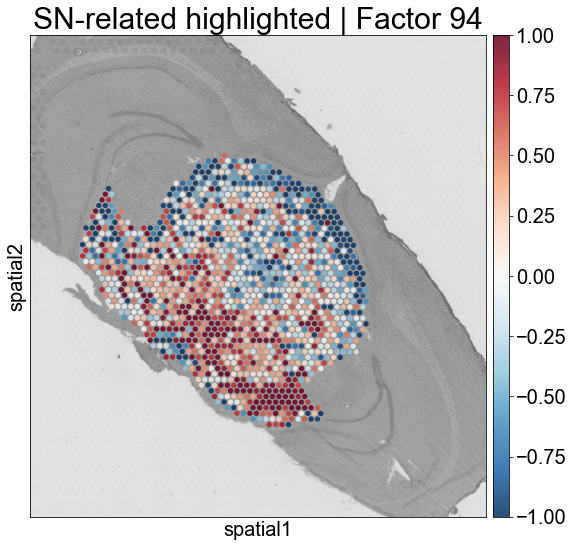

In [67]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# -----------------------------
# Settings
# -----------------------------
factor_idx = 94
region_col = "RegionLoupe"
keep_regions = ["VTA-SNc", "SNr","MB","PAG"]

# -----------------------------
# 1) Raw latent values
# -----------------------------
raw = adata_filtered.obs[f'latent_combined_{factor_idx}'].astype(float)

# -----------------------------
# 2) Mask ACB + CP
# -----------------------------
mask = adata_filtered.obs[region_col].isin(keep_regions)
r = raw[mask].values

# -----------------------------
# 3) Quantile normalization (ACB+CP only)
# -----------------------------
q1, q2 = np.percentile(r, [10, 90])
z = (raw - q1) / (q2 - q1 + 1e-8)
z = np.clip(z, 0, 1) * 2 - 1   # -> [-1, 1]

plot_key = f'latent_{factor_idx}_qnorm'
adata_filtered.obs[plot_key] = np.nan
adata_filtered.obs.loc[mask, plot_key] = z.loc[mask].values

# -----------------------------
# 4) Plot
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 8))
sc.pl.spatial(
    adata_filtered,
    color=plot_key,
    cmap='RdBu_r',
    vmin=-1, vmax=1,
    na_color=(0, 0, 0, 0),
    img_key='hires',
    bw=True,
    alpha_img=0.6,
    size=4.0,
    spot_size=120,
    alpha=0.85,
    ax=ax,
    show=False,
)
ax.set_title("SN-related highlighted | Factor 94",fontsize=30,fontname='Arial')
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
plt.savefig(f"Factor_{factor_idx}_highlighted_spatial.svg", format="svg", dpi=300, bbox_inches="tight")  # 保存
plt.show()



<ipython-input-68-875d92046347>:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-68-875d92046347>:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


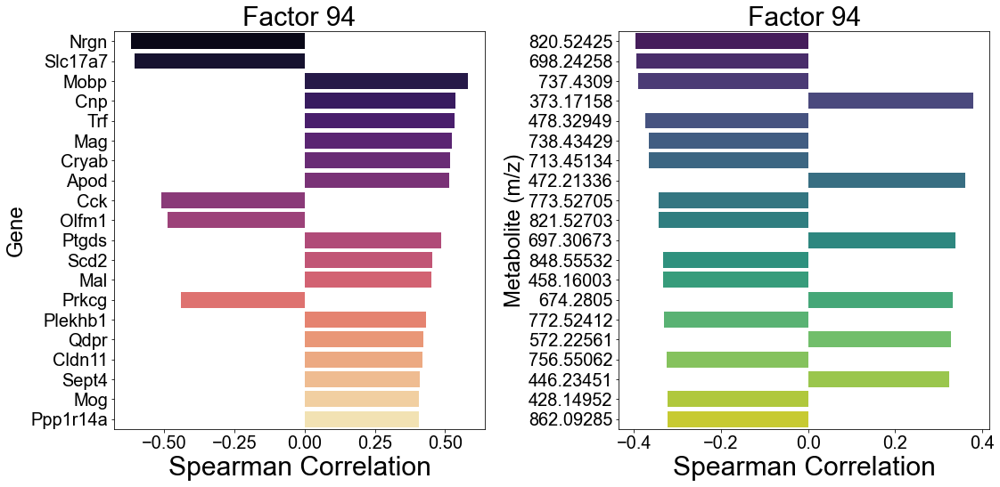

In [68]:
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

# ---------------------------------------------------------
# Settings
# ---------------------------------------------------------
plt.rcParams['font.family'] = 'Arial'
factor_idx = 94  # factor of interest

# ---------------------------------------------------------
# Helper: parse factor id
# ---------------------------------------------------------
def parse_factor_id(x):
    m = re.search(r'(\d+)$', str(x))
    return int(m.group(1)) if m else np.nan

# ---------------------------------------------------------
# Ensure numeric Factor_id exists
# ---------------------------------------------------------
if 'Factor_id' not in gene_corr_df.columns:
    gene_corr_df['Factor_id'] = gene_corr_df['Factor'].apply(parse_factor_id)
if 'Factor_id' not in met_corr_df.columns:
    met_corr_df['Factor_id'] = met_corr_df['Factor'].apply(parse_factor_id)

# ---------------------------------------------------------
# Select top 20 by |Correlation| (high → low)
# ---------------------------------------------------------
top_genes_factor = (
    gene_corr_df[gene_corr_df['Factor_id'] == factor_idx]
    .assign(abs_corr=lambda df: df['Correlation'].abs())
    .sort_values('abs_corr', ascending=False)
    .head(20)
    .copy()
)

top_mets_factor = (
    met_corr_df[met_corr_df['Factor_id'] == factor_idx]
    .assign(abs_corr=lambda df: df['Correlation'].abs())
    .sort_values('abs_corr', ascending=False)
    .head(20)
    .copy()
)

# ---------------------------------------------------------
# Sort for plotting (weak → strong so invert_yaxis puts strong on top)
# ---------------------------------------------------------
top_genes_factor = top_genes_factor.sort_values('abs_corr', ascending=True)
top_mets_factor  = top_mets_factor.sort_values('abs_corr', ascending=True)

# ---------------------------------------------------------
# Color mapping: deep → light for strong → weak
# ---------------------------------------------------------
gene_norm = mpl.colors.Normalize(
    vmin=top_genes_factor['abs_corr'].min(),
    vmax=top_genes_factor['abs_corr'].max()
)
met_norm = mpl.colors.Normalize(
    vmin=top_mets_factor['abs_corr'].min(),
    vmax=top_mets_factor['abs_corr'].max()
)

gene_colors = sns.color_palette(
    "magma_r", n_colors=len(top_genes_factor)
)
met_colors = sns.color_palette(
    "viridis_r", n_colors=len(top_mets_factor)
)

# ---------------------------------------------------------
# Create figure
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# ---------------------------------------------------------
# Left panel: gene correlations
# ---------------------------------------------------------
sns.barplot(
    ax=axes[0],
    y='Gene',
    x='Correlation',
    data=top_genes_factor,
    palette=gene_colors
)
axes[0].set_title(f'Factor {factor_idx}', fontsize=30)
axes[0].set_xlabel('Spearman Correlation', fontsize=30)
axes[0].set_ylabel('Gene', fontsize=24)
axes[0].tick_params(axis='x', labelsize=20)
axes[0].tick_params(axis='y', labelsize=20)
axes[0].invert_yaxis()  # strongest at top

# ---------------------------------------------------------
# Right panel: metabolite correlations
# ---------------------------------------------------------
sns.barplot(
    ax=axes[1],
    y='Metabolite',
    x='Correlation',
    data=top_mets_factor,
    palette=met_colors
)
axes[1].set_title(f'Factor {factor_idx}', fontsize=30)
axes[1].set_xlabel('Spearman Correlation', fontsize=30)
axes[1].set_ylabel('Metabolite (m/z)', fontsize=24)
axes[1].tick_params(axis='x', labelsize=20)
axes[1].tick_params(axis='y', labelsize=20)
axes[1].invert_yaxis()  # strongest at top

# ---------------------------------------------------------
# Final layout and save
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(f'Factor_{factor_idx}.svg', format='svg', bbox_inches='tight')
plt.show()


In [69]:
# ---------------------------------------------------------
# Convert results to DataFrame
# ---------------------------------------------------------
gene_corr_df = pd.DataFrame(gene_corr_results)

# ---------------------------------------------------------
# Multiple testing correction (Benjamini–Hochberg FDR)
# ---------------------------------------------------------
_, gene_corr_df['FDR'], _, _ = multipletests(
    gene_corr_df['P_value'], method='fdr_bh'
)

gene_corr_df['Factor'] = gene_corr_df['Factor'].astype(str)

# ---------------------------------------------------------
# Process Factor 94
# ---------------------------------------------------------
factor_idx = '94'

# Subset results for the current factor
df_factor = gene_corr_df[gene_corr_df['Factor'] == factor_idx].copy()

# Sort by FDR (ascending) and select top 300 genes
top300_genes = (
    df_factor
    .sort_values('FDR', ascending=True)
    .head(300)
)

# Save to CSV
out_file = f'Factor{factor_idx}_top300_genes_byFDR.csv'
top300_genes.to_csv(out_file, index=False)

print(f"Saved {out_file}: {top300_genes.shape[0]} genes")


Saved Factor94_top300_genes_byFDR.csv: 300 genes


<ipython-input-74-b22ef7f9ee45>:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_df_selected['Category'] = overall_df_selected['Description'].map(term_to_category)
<ipython-input-74-b22ef7f9ee45>:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  overall_df_selected['Description'] = overall_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)
<ipython-input-74-b22ef7f9ee45>:84: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_y

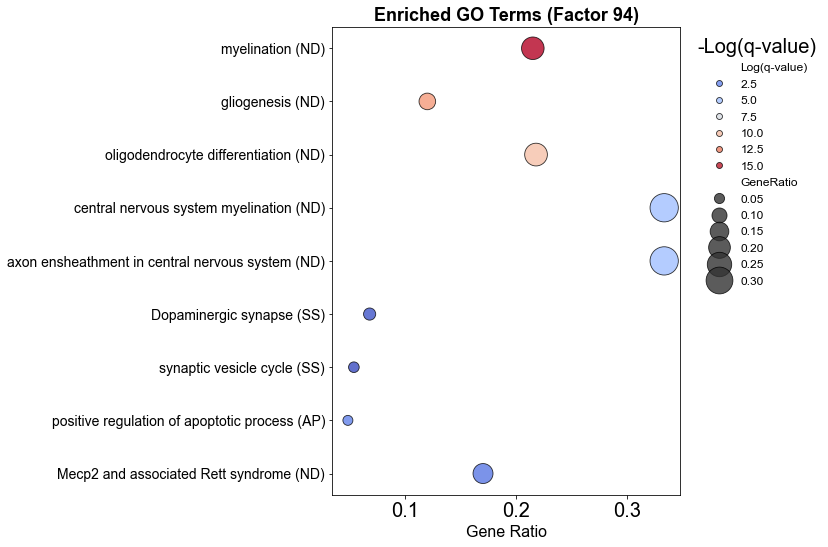

In [74]:
# Enrichment analysis was performed using Metascape
mpl.rcParams['font.family'] = 'Arial'
overall_df = pd.read_csv('top300_genes_Factor94_overall_enrichment/Enrichment_GO/_FINAL_GO.csv')
overall_df = overall_df[['Description', 'Log(q-value)', 'Enrichment']].copy()
overall_df['GeneRatio'] = overall_df['Enrichment'] / overall_df['Enrichment'].max()

selected_terms = [
    'Mecp2 and associated Rett syndrome',
    'axon ensheathment in central nervous system',
    'central nervous system myelination',
    'myelination',
    'gliogenesis',
    'oligodendrocyte differentiation',
    'Dopaminergic synapse - Mus musculus (house mouse)',
    'G protein-coupled dopamine receptor signaling pathway',
    'cellular response to dopamine',
    'chemical synaptic transmission',
    'synaptic transmission, glutamatergic',
    'anterograde trans-synaptic signaling',
    'MHC class II antigen presentation',
    'negative regulation of endopeptidase activity',
    'Parkinson disease - Mus musculus (house mouse)',
    'synaptic vesicle cycle',
    'excitatory postsynaptic potential',
    'Gap junction - Mus musculus (house mouse)',
    'GABAergic synapse - Mus musculus (house mouse)',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)',
    'Transmission across Chemical Synapses',
    'cAMP signaling pathway - Mus musculus (house mouse)',
    'Calcium signaling pathway - Mus musculus (house mouse)',
    'positive regulation of leukocyte activation',
    'positive regulation of apoptotic process',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)'
]

overall_df_selected = overall_df[overall_df['Description'].isin(selected_terms)]

term_to_category = {
    'Mecp2 and associated Rett syndrome': 'ND',
    'axon ensheathment in central nervous system': 'ND',
    'central nervous system myelination': 'ND',
    'myelination': 'ND',
    'gliogenesis': 'ND',
    'oligodendrocyte differentiation': 'ND',
    'Dopaminergic synapse - Mus musculus (house mouse)': 'SS',
    'G protein-coupled dopamine receptor signaling pathway': 'SS',
    'cellular response to dopamine': 'SS',
    'chemical synaptic transmission': 'SS',
    'synaptic transmission, glutamatergic': 'SS',
    'anterograde trans-synaptic signaling': 'SS',
    'MHC class II antigen presentation': 'IM',
    'negative regulation of endopeptidase activity': 'PH',
    'Parkinson disease - Mus musculus (house mouse)': 'PD',
    'synaptic vesicle cycle': 'SS',
    'excitatory postsynaptic potential': 'SS',
    'Gap junction - Mus musculus (house mouse)': 'SS',
    'GABAergic synapse - Mus musculus (house mouse)': 'SS',
    'Retrograde endocannabinoid signaling - Mus musculus (house mouse)': 'SS',
    'Transmission across Chemical Synapses': 'SS',
    'cAMP signaling pathway - Mus musculus (house mouse)': 'CA',
    'Calcium signaling pathway - Mus musculus (house mouse)': 'CA',
    'positive regulation of leukocyte activation': 'IM',
    'positive regulation of apoptotic process': 'AP',
    'Pathways of neurodegeneration - multiple diseases - Mus musculus (house mouse)': 'NG'
}

overall_df_selected['Category'] = overall_df_selected['Description'].map(term_to_category)
overall_df_selected['Description'] = overall_df_selected['Description'].str.replace(r' - Mus musculus \(house mouse\)', '', regex=True)

fig, ax = plt.subplots(figsize=(12, 8))

sns.scatterplot(
    data=overall_df_selected,
    x='GeneRatio', y='Description',
    size='GeneRatio', hue=-overall_df_selected['Log(q-value)'],
    sizes=(100, 800),
    palette=sns.color_palette("coolwarm", as_cmap=True),
    edgecolor='black', alpha=0.8, ax=ax
)

yticks_labels = ax.get_yticklabels()
description_to_category = overall_df_selected.set_index('Description')['Category'].to_dict()
new_yticks_labels = [f"{label.get_text()} ({description_to_category.get(label.get_text(), '')})" for label in yticks_labels]
ax.set_yticklabels(new_yticks_labels, fontsize=14)

plt.xlabel('Gene Ratio', fontsize=16)
plt.ylabel('')
plt.title('Enriched GO Terms (Factor 94)', fontsize=18, fontweight='bold')
plt.legend(title='-Log(q-value)', bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)

plt.tight_layout()
plt.savefig('Factor_o94verall_GO.svg', format='svg', bbox_inches='tight')

plt.show()


## Gene-metabolite correlation

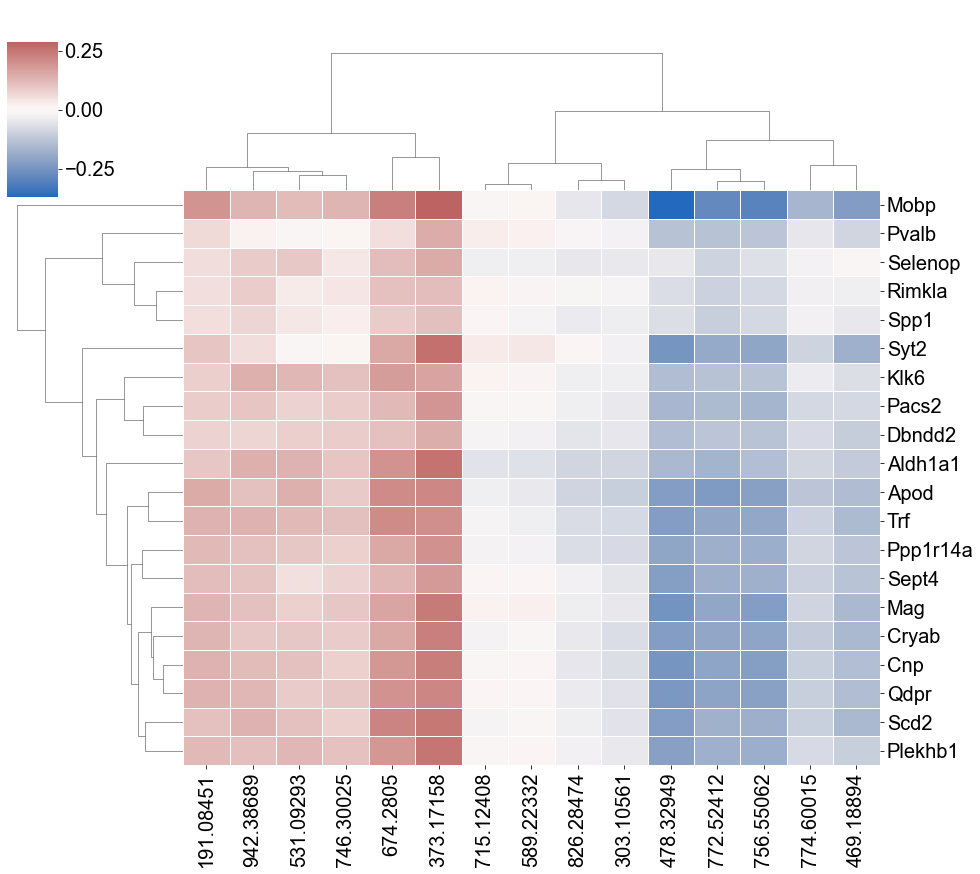

In [76]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Selected metabolites and genes
# ---------------------------------------------------------
selected_metabolites = [
    '191.08451', '715.12408', '589.22332', '774.60015', '826.28474',
    '303.10561', '469.18894', '674.2805',  '942.38689', '531.09293',
    '746.30025', '373.17158', '478.32949', '772.52412', '756.55062'
]

selected_genes = [
    'Pvalb', 'Syt2', 'Mobp', 'Rimkla', 'Aldh1a1',
    'Ppp1r14a', 'Spp1', 'Klk6', 'Apod', 'Cnp',
    'Selenop', 'Trf', 'Scd2', 'Qdpr', 'Plekhb1',
    'Pacs2', 'Mag', 'Cryab', 'Dbndd2', 'Sept4'
]

# ---------------------------------------------------------
# Align gene expression and metabolite abundance by common indices
# ---------------------------------------------------------
common_index = transcript_expr.index.intersection(metabolite_abundance.index)
gene_expr = transcript_expr.loc[common_index, selected_genes].copy()
met_expr  = metabolite_abundance.loc[common_index, selected_metabolites].copy()

# ---------------------------------------------------------
# Compute Spearman correlation matrix
# ---------------------------------------------------------
corr_matrix = pd.DataFrame(
    index=selected_genes,
    columns=selected_metabolites,
    dtype=float
)

for g in selected_genes:
    for m in selected_metabolites:
        rho, pval = spearmanr(gene_expr[g], met_expr[m])
        corr_matrix.loc[g, m] = rho

# ---------------------------------------------------------
# Plot gene–metabolite Spearman correlation heatmap
# ---------------------------------------------------------
sns.clustermap(
    corr_matrix.astype(float),
    cmap='vlag',
    center=0,
    linewidths=0.5,
    figsize=(14, 12)
)

plt.suptitle(
    ' ',
    y=1.02,
    fontsize=30,
    fontweight='bold'
)

plt.savefig(
    'Gene-Metabolite_Spearman_Correlation_Heatmap.svg',
    format='svg',
    bbox_inches='tight'
)
plt.show()


## Spatial distribution of PD-related genes and metabolites 

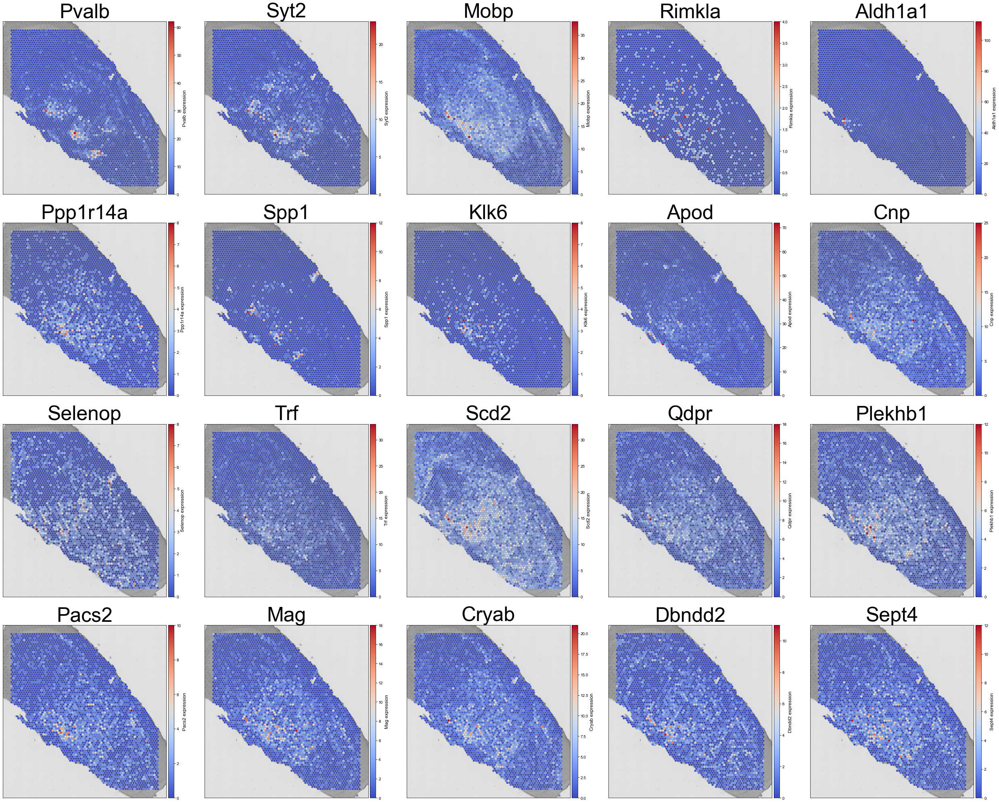

In [53]:
import scanpy as sc
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Selected marker genes from cluster 7, 9, 11 and Factor 94
# ---------------------------------------------------------
selected_genes = [
    'Pvalb', 'Syt2', 'Mobp', 'Rimkla', 'Aldh1a1',
    'Ppp1r14a', 'Spp1', 'Klk6', 'Apod', 'Cnp',
    'Selenop', 'Trf', 'Scd2', 'Qdpr', 'Plekhb1',
    'Pacs2', 'Mag', 'Cryab', 'Dbndd2', 'Sept4'
]

# ---------------------------------------------------------
# Define subplot layout (4 rows × 5 columns)
# ---------------------------------------------------------
ncols = 5
nrows = 4
fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(7 * ncols, 7 * nrows)
)

# ---------------------------------------------------------
# Plot spatial expression for each selected gene
# ---------------------------------------------------------
for idx, gene in enumerate(selected_genes):
    ax = axes.flatten()[idx]

    sc.pl.spatial(
        adata_filtered,
        color=gene,
        cmap='coolwarm',
        size=5,
        spot_size=100,
        img_key='hires',
        bw=True,
        alpha_img=0.6,
        ax=ax,
        show=False,
    )

    # Adjust colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_label(f'{gene} expression', fontsize=12, fontname='Arial')
    cbar.ax.tick_params(labelsize=10)

    # Remove axis ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(gene, fontsize=50, fontname='Arial')

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(
    'selected_genes_spatial_expression.pdf',
    format='pdf',
    bbox_inches='tight'
)
plt.show()


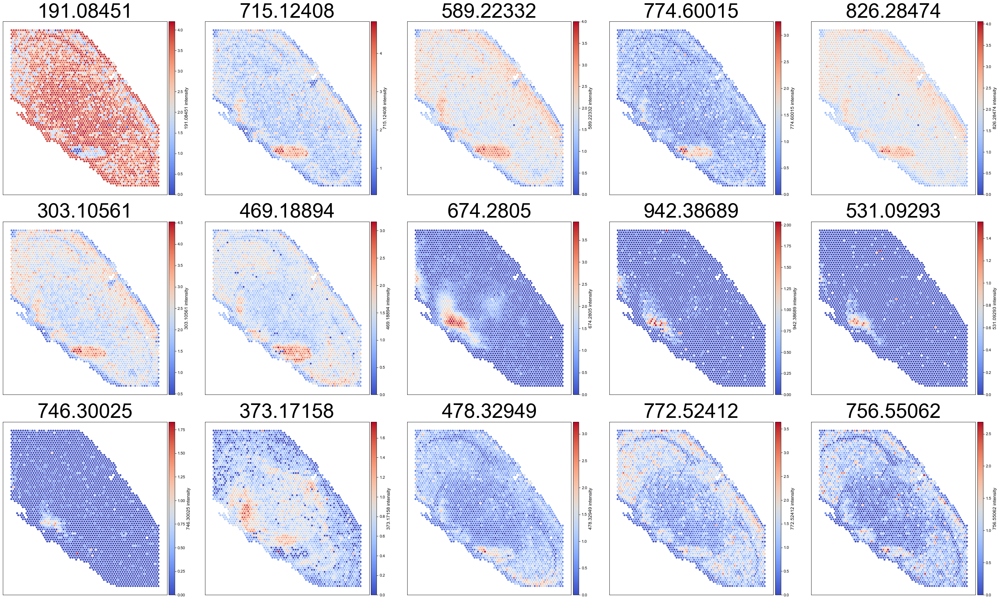

In [54]:
import scanpy as sc
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# Ensure spatial coordinates are stored in adata.obsm['spatial']
# ---------------------------------------------------------
adata.obsm['spatial'] = adata.obs[['x', 'y']].values

# ---------------------------------------------------------
# Selected metabolites for spatial visualization (m/z values)
# ---------------------------------------------------------
selected_metabolites = [
    '191.08451', '715.12408', '589.22332', '774.60015', '826.28474',
    '303.10561', '469.18894', '674.2805',  '942.38689', '531.09293',
    '746.30025', '373.17158', '478.32949', '772.52412', '756.55062'
]

# Add prefix for data lookup in AnnData
marker_metabolites = [f'met_{m}' for m in selected_metabolites]

# ---------------------------------------------------------
# Define subplot layout
# ---------------------------------------------------------
ncols = 5
nrows = 3
fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(7 * ncols, 7 * nrows)
)

# ---------------------------------------------------------
# Plot spatial distribution for each metabolite
# ---------------------------------------------------------
for idx, metabolite in enumerate(marker_metabolites):
    ax = axes.flatten()[idx]

    sc.pl.spatial(
        adata,
        color=metabolite,
        cmap='coolwarm',
        size=2,
        spot_size=10,
        img_key=None,
        alpha_img=0.6,
        ax=ax,
        show=False,
    )

    # Remove 'met_' prefix for display
    clean_name = metabolite.replace('met_', '')

    # Adjust colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_label(f'{clean_name} intensity', fontsize=12, fontname='Arial')
    cbar.ax.tick_params(labelsize=10)

    # Aesthetic adjustments
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(clean_name, fontsize=50, fontname='Arial')

# ---------------------------------------------------------
# Remove unused subplots
# ---------------------------------------------------------
for j in range(len(marker_metabolites), nrows * ncols):
    fig.delaxes(axes.flatten()[j])

# ---------------------------------------------------------
# Final layout and save figure
# ---------------------------------------------------------
plt.tight_layout()
plt.savefig(
    'selected_metabolite_spatial_expression.pdf',
    format='pdf',
    bbox_inches='tight'
)
plt.show()


# Comparison

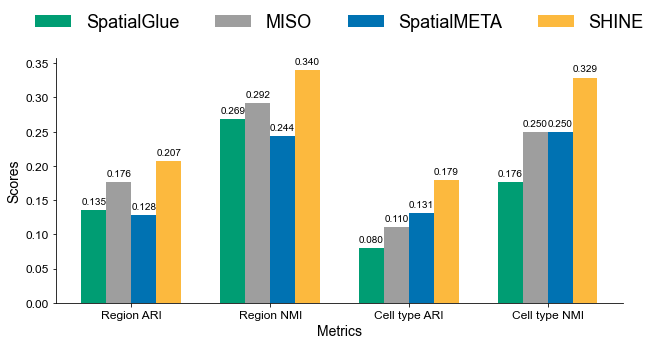

In [3]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Arial'

# -----------------------------
# Metrics and data
# -----------------------------
indicators = ['Region ARI', 'Region NMI', 'Cell type ARI', 'Cell type NMI']

SpatialGlue = [0.135, 0.269, 0.080, 0.176]
MISO = [0.176, 0.292, 0.110, 0.250]
SpatialMETA = [0.128, 0.244, 0.131, 0.250]
SHINE = [0.207, 0.340, 0.179, 0.329]

methods = ['SpatialGlue', 'MISO', 'SpatialMETA', 'SHINE']

colors = [
    '#009D73',  
    '#9E9E9E',  
    '#0072B2',  
    '#FCB93E'  
]

data = np.array([SpatialGlue, MISO, SpatialMETA, SHINE])

# -----------------------------
# Figure canvas
# -----------------------------
x = np.arange(len(indicators))
width = 0.18

fig, ax = plt.subplots(figsize=(9.5, 5))

# -----------------------------
# Bar plot
# -----------------------------
rects = []
for i, method in enumerate(methods):
    rect = ax.bar(
        x + (i - (len(methods) - 1) / 2) * width,
        data[i],
        width,
        label=method,
        color=colors[i]
    )
    rects.append(rect)

# -----------------------------
# Axes labels and ticks
# -----------------------------
ax.set_xlabel('Metrics', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(indicators, fontsize=12)
ax.tick_params(axis='y', labelsize=12)

ax.legend(
    fontsize=18,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.25),
    ncol=4,
    frameon=False
)

for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# -----------------------------
# Value annotations
# -----------------------------
def autolabel(rects):
    """Annotate values above bars"""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(
            f'{height:.3f}',
            xy=(rect.get_x() + rect.get_width() / 2, height),
            xytext=(0, 4),
            textcoords="offset points",
            ha='center',
            va='bottom',
            fontsize=10,
            fontfamily='Arial'
        )

for rect_group in rects:
    autolabel(rect_group)

fig.tight_layout()

# -----------------------------
# Save figure
# -----------------------------
plt.savefig(
    'metrics_comparison.svg',
    format='svg',
    bbox_inches='tight'
)

plt.show()
